<a href="https://colab.research.google.com/github/thiagocquinto/datascience/blob/main/MVP2_Thiago_Quinto_rev1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#MVP de Machine Learning & Analytics

**Thiago Correa do Quinto**

##1. Modelo utilizando métodos clássicos para um problema de classificação(MVP 2.a)

O conjunto dados utilizado neste projeto é **Heart Attack Analysis & Prediction Dataset** muito usado para a tarefa de classificação e previsão de ataques cardíacos. Ele contém informações médicas relevantes e características de pacientes que foram coletadas para fins de análise e previsão de ataques cardíacos.

A análise e previsão de ataques cardíacos são cruciais para a saúde pública, pois permitem a implementação de medidas preventivas e intervenções médicas precoces para reduzir o risco de eventos cardiovasculares graves.

O objetivo deste projeto é criar um modelo de classificação capaz de prever se um paciente está em risco de sofrer um ataque cardíaco com base nas características fornecidas.

Características (Features):

1. **Age** : Idade do paciente

2. **Sex** : Sexo do paciente

3. **exang**: angina induzida por atividade física (1 = sim; 0 = não)

4. **caa**: número de vasos principais (0-3)

5. **cp** : Tipo de dor no peito

>>*Valor 1*: angina típica

>>*Valor 2*: angina atípica

>>*Valor 3*: dor não anginosa

>>*Valor 4*: assintomático

6. **trtbps** : pressão arterial em repouso (em mm Hg)

7. **chol** : colesterol em mg/dl medido via sensor IMC

8. **fbs** : (açúcar no sangue em jejum > 120 mg/dl) (1 = verdadeiro; 0 = falso)

9. **rest_ecg** : resultados eletrocardiográficos em repouso

>>*Valor 0*: normal

>>*Valor 1*: tendo anormalidade da onda ST-T (inversões da onda T e/ou elevação ou depressão ST > 0,05 mV)

>>*Valor 2*: mostrando hipertrofia ventricular esquerda provável ou definitiva pelos critérios de Estes

10. **thalach** : frequência cardíaca máxima alcançada

11. **old peak**:  depressão do ST induzida pelo exercício em relação ao repouso

12. **slp**: a inclinação do pico do segmento ST do exercício

>>*0* = sem inclinação

>>*1* = plano

>>*2* = descendente

13. **thall**: talassemia

>>*0* = nulo

>>*1* = defeito fixo

>>*2* = normais

>*3* = defeito reversível

14. **target** :
>>*0* = menor chance de ataque cardíaco

>>*1* = grande chance de ataque cardíaco

Fonte: O conjunto de dados pode ser originado de várias fontes, incluindo repositórios de dados abertos, como Kaggle (https://www.kaggle.com/datasets/rashikrahmanpritom/heart-attack-analysis-prediction-dataset).

In [83]:
# Configuração para não exibir os warnings
import warnings
warnings.filterwarnings("ignore")

In [84]:
# Importação de bibliotecas necessárias
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler

from sklearn.model_selection import train_test_split
from sklearn.model_selection import KFold
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV

from sklearn.metrics import accuracy_score

from sklearn.pipeline import Pipeline

from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier # algoritmo Árvore de Regressão
from sklearn.neighbors import KNeighborsClassifier # algoritmo KNN
from sklearn.naive_bayes import GaussianNB # algoritmo Naive Bayes
from sklearn.svm import SVC # algoritmo SVM

from sklearn.ensemble import BaggingClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import ExtraTreesClassifier # ExtraTrees, para a importância de Atributos
from sklearn.ensemble import VotingClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import GradientBoostingClassifier

from sklearn.metrics import accuracy_score, confusion_matrix
from sklearn.model_selection import KFold

from sklearn.feature_selection import SelectKBest # para a seleção univariada
from sklearn.feature_selection import f_classif # para o teste ANOVA da seleção univariada
from sklearn.feature_selection import RFE # para a Eliminação Recursiva de atributos
from sklearn.linear_model import LogisticRegression # Regressão Logística, para a eliminação recursiva de atributos

###1. Carga de Dados

In [85]:
# importando dados de url para um dataframe

# url a importar
url_dados='https://raw.githubusercontent.com/thiagocquinto/datasets/main/heart.csv'

dataset=pd.read_csv(url_dados, delimiter=',')

display(dataset.head()) # foram carregadas 5 linhas para ter uma visão melhor dos dados do dataset

,age,sex,cp,trtbps,chol,fbs,restecg,thalachh,exng,oldpeak,slp,caa,thall,output
0,63,1,3,145,233,1,0,150,0,2.3,0,0,1,1
1,37,1,2,130,250,0,1,187,0,3.5,0,0,2,1
2,41,0,1,130,204,0,0,172,0,1.4,2,0,2,1
3,56,1,1,120,236,0,1,178,0,0.8,2,0,2,1
4,57,0,0,120,354,0,1,163,1,0.6,2,0,2,1


###2. Análise dos Dados

In [86]:
print(dataset.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 303 entries, 0 to 302
Data columns (total 14 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   age       303 non-null    int64  
 1   sex       303 non-null    int64  
 2   cp        303 non-null    int64  
 3   trtbps    303 non-null    int64  
 4   chol      303 non-null    int64  
 5   fbs       303 non-null    int64  
 6   restecg   303 non-null    int64  
 7   thalachh  303 non-null    int64  
 8   exng      303 non-null    int64  
 9   oldpeak   303 non-null    float64
 10  slp       303 non-null    int64  
 11  caa       303 non-null    int64  
 12  thall     303 non-null    int64  
 13  output    303 non-null    int64  
dtypes: float64(1), int64(13)
memory usage: 33.3 KB
None


Dataset com dimensão de 303 linhas por 14 colunas

In [87]:
dataset.describe()

,age,sex,cp,trtbps,chol,fbs,restecg,thalachh,exng,oldpeak,slp,caa,thall,output
count,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000
mean,54.366337,0.683168,0.966997,131.623762,246.264026,0.148515,0.528053,149.646865,0.326733,1.039604,1.399340,0.729373,2.313531,0.544554
std,9.082101,0.466011,1.032052,17.538143,51.830751,0.356198,0.525860,22.905161,0.469794,1.161075,0.616226,1.022606,0.612277,0.498835
min,29.000000,0.000000,0.000000,94.000000,126.000000,0.000000,0.000000,71.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,47.500000,0.000000,0.000000,120.000000,211.000000,0.000000,0.000000,133.500000,0.000000,0.000000,1.000000,0.000000,2.000000,0.000000
50%,55.000000,1.000000,1.000000,130.000000,240.000000,0.000000,1.000000,153.000000,0.000000,0.800000,1.000000,0.000000,2.000000,1.000000
75%,61.000000,1.000000,2.000000,140.000000,274.500000,0.000000,1.000000,166.000000,1.000000,1.600000,2.000000,1.000000,3.000000,1.000000
max,77.000000,1.000000,3.000000,200.000000,564.000000,1.000000,2.000000,202.000000,1.000000,6.200000,2.000000,4.000000,3.000000,1.000000


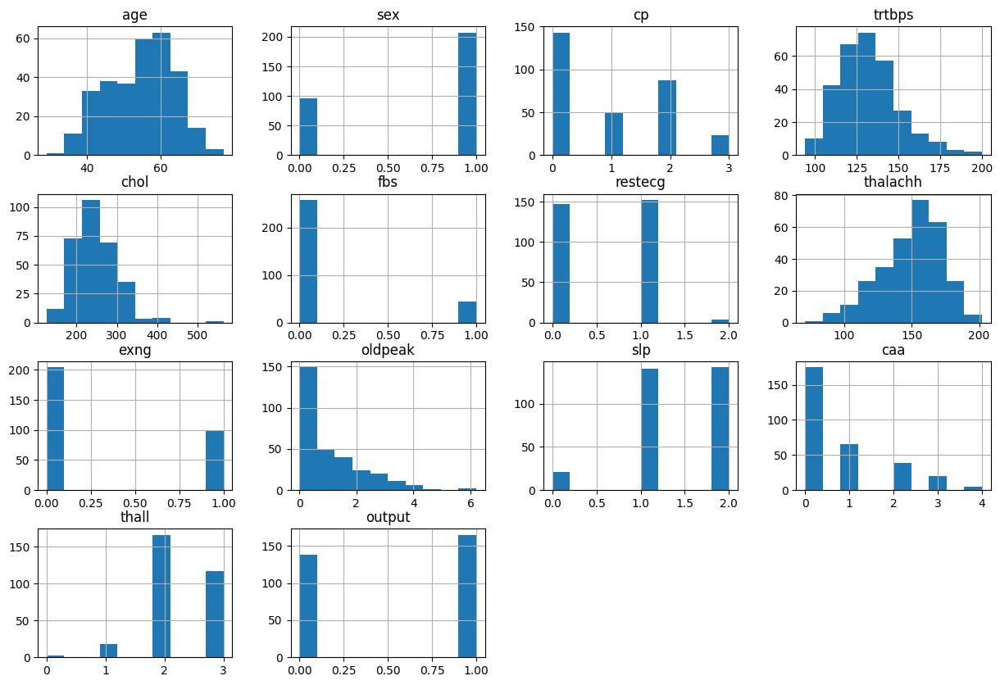

In [88]:
dataset.hist(figsize = (15,10));

As colunas age, trtbps, chol,thalachh e oldpeak apresentam distribuição de dados com valores discretos enquanto os as outras colunas apresentam dados categóricos. Há um ligeiro desbalanceamento na variável de saída output.

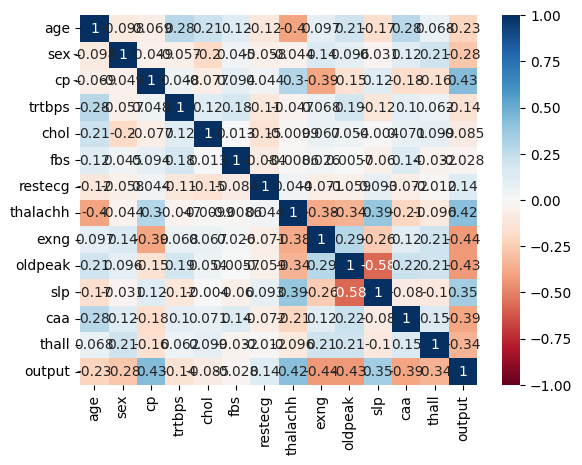

In [89]:
# Matriz de Correlação com Matplotlib Seaborn - mudança de escala de cores entre -1 e 1
sns.heatmap(dataset.corr(), annot=True, cmap='RdBu',vmin=-1, vmax=1);

In [90]:
# verificando nulls no dataset
dataset.isnull().sum()

age         0
sex         0
cp          0
trtbps      0
chol        0
fbs         0
restecg     0
thalachh    0
exng        0
oldpeak     0
slp         0
caa         0
thall       0
output      0
dtype: int64

O dataset não possui valores nulos, não sendo necessário nenhum tratamento de missings

###3. Pré-processamento dos dados

In [91]:
# Preparação dos dados

# Preparação dos para etapa de feature selection
array=dataset.values
X=array[:,0:13] # atributos
y=array[:,13] # classe (target)

In [92]:
# SelectKBest

# Seleção de atributos com SelectKBest
best_var = SelectKBest(score_func=f_classif,k=7)

# Executa a função de pontuação em (X,y) e obtém os atributos selecionados
fit = best_var.fit(X,y)

# Reduz X para os atributos selecionados
features=fit.transform(X)

# Resultados
print('\nNúmero original de atributos: ', X.shape[1])
print('\nNúmero reduzido de atributos: ', features.shape[1])

# Exibe os atributos originais
print('\nAtributos Originais: ', dataset.columns[0:13])

# Exibe as pontuações de cada atributo e os 4 escolhidos (com as pontuações mais altas)
atributos_selecionados_kbest=fit.get_feature_names_out(input_features=dataset.columns[0:13])
np.set_printoptions(precision=3) # 3 casas decimais
print('\nScores dos Atributos Originais: ', fit.scores_)
print('\nAtributos Selecionados: ', best_var.get_feature_names_out(input_features=dataset.columns[0:13]))


Número original de atributos:  13

Número reduzido de atributos:  7

Atributos Originais:  Index(['age', 'sex', 'cp', 'trtbps', 'chol', 'fbs', 'restecg', 'thalachh',
       'exng', 'oldpeak', 'slp', 'caa', 'thall'],
      dtype='object')

Scores dos Atributos Originais:  [16.117 25.792 69.772  6.458  2.203  0.237  5.777 65.12  70.952 68.551
 40.902 54.56  40.408]

Atributos Selecionados:  ['cp' 'thalachh' 'exng' 'oldpeak' 'slp' 'caa' 'thall']


In [93]:
# Eliminação Recursiva de Atributos

# Criação do modelo
modelo=LogisticRegression(max_iter=200)

# Eliminação Recursiva de Atributos
rfe=RFE(modelo,n_features_to_select=7)
fit=rfe.fit(X,y)

# Print dos resultados
print('Atributos Originais: ', dataset.columns[0:13])

# Exibe os atributos selecionados (marcados como True em 'Atributos Selecionados')
# e com valor 1 em 'Ranking dos Atributos')
atributos_selecionados_recur=fit.get_feature_names_out(input_features=dataset.columns[0:13])
print('\nAtributos Selecionados: %s' % fit.support_)
print('\nRanking de atributos: %s' % fit.ranking_)
print('\nQtd de melhores Atributos: %d' % fit.n_features_)
print('\nNomes dos Atributos Selecionados: %s' % atributos_selecionados_recur)

Atributos Originais:  Index(['age', 'sex', 'cp', 'trtbps', 'chol', 'fbs', 'restecg', 'thalachh',
       'exng', 'oldpeak', 'slp', 'caa', 'thall'],
      dtype='object')

Atributos Selecionados: [False  True  True False False False False False  True  True  True  True
  True]

Ranking de atributos: [6 1 1 5 7 3 2 4 1 1 1 1 1]

Qtd de melhores Atributos: 7

Nomes dos Atributos Selecionados: ['sex' 'cp' 'exng' 'oldpeak' 'slp' 'caa' 'thall']


Ambos os critérios utilizados para redução de atributos quase convergiram para as mesmas colunas. Nessa seleção somente a coluna sex e thalachh diverge em cada técnica.

In [94]:
# Importância de Atributos com ExtraTrees

# Criação do modelo para seleção de atributos
modelo=ExtraTreesClassifier(n_estimators=100)
modelo.fit(X,y)

# Exibe os atributos originais
print('\nAtributos Originais: ', dataset.columns[0:13])

# Exibe a pontuação de importância para cada atributo (quanto maior a pontuação mais importante é o atributo)
print(modelo.feature_importances_)


Atributos Originais:  Index(['age', 'sex', 'cp', 'trtbps', 'chol', 'fbs', 'restecg', 'thalachh',
       'exng', 'oldpeak', 'slp', 'caa', 'thall'],
      dtype='object')
[0.07  0.052 0.133 0.063 0.054 0.022 0.034 0.082 0.098 0.09  0.07  0.125
 0.105]


Pelo resultado da importância de atributos, a técnica mais aderente foi a SelectKBest, pois a importância de *sex* é 0.052 e a de *thalachh* é 0.082.

In [95]:
atributos_selecionados=atributos_selecionados_kbest

#### Separação de conjunto de treino e teste

In [96]:
test_size=0.20 # tamanho do conjunto de teste
seed=7 # semente aleatória

# Separação em conjuntos de treino e teste

X=dataset.loc[:,atributos_selecionados].values
y=dataset.loc[:,'output'].values
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=test_size,shuffle=True, random_state=seed,stratify=y) # holdout com estratificação

# Parâmetros e partições da validação cruzada
scoring='accuracy'
num_particoes=10
kfold=StratifiedKFold(n_splits=num_particoes,shuffle=True,random_state=seed) # validação cruzada com estratificação

####Modelos e Parâmetros de Votação

In [97]:
np.random.seed(7) # definindo uma semente global

# Lista que armazenará o modelo
models=[]

# Criando os modelos e adicionando-os na lista de modelos
models.append(('LR',LogisticRegression(max_iter=200))) # Algoritmo de Regressão Logística
models.append(('KNN',KNeighborsClassifier())) # Algoritmo KNN
models.append(('CART', DecisionTreeClassifier())) # Algoritmo de Árvore de Decisão
models.append(('NB',GaussianNB())) #Algoritmo Naive Bayes
models.append(('SVM',SVC())) # Algoritmo SVM

# Definindo os parâmetros do classificador base para o BaggingClassifier
base=DecisionTreeClassifier()
num_trees=100
max_features=3

# Criando os modelos para o VotingClassifier
bases=[]
model1=LogisticRegression(max_iter=200) # Algoritmo de Regressão Logística
bases.append(('logistic',model1))
model2=DecisionTreeClassifier() # Algoritmo de Árvore de Decisão
bases.append(('cart',model2))
model3=SVC() # Algoritmo SVM
bases.append(('svm',model3))

####Pipeline

In [101]:
# Listas para armazenar os pipelines e os resultados para todas as visões do dataset
pipelines=[]
results=[]
names=[]

# Criando os elementos do pipeline

# Algoritmos que serão utilizados
reg_log=('LR',LogisticRegression(max_iter=200))
knn=('KNN',KNeighborsClassifier())
cart=('CART', DecisionTreeClassifier())
naives_bayes=('NB',GaussianNB())
svm=('SVM',SVC())
bagging=('Bagging',BaggingClassifier(base_estimator=base,n_estimators=num_trees))
random_forest=('RF',RandomForestClassifier(n_estimators=num_trees,max_features=max_features))
extra_trees=('ET',ExtraTreesClassifier(n_estimators=num_trees,max_features=max_features))
adaboost=('Ada',AdaBoostClassifier(n_estimators=num_trees))
gradient_boosting=('GB',GradientBoostingClassifier(n_estimators=num_trees))
voting=('Voting',VotingClassifier(bases))

# Transformações que serão utilizadas
standard_scaler=('StandardScaler',StandardScaler())
min_max_scaler=('MinMaxScaler',MinMaxScaler())


LR-orig: 0.838833 (0.065511)
KNN-orig: 0.706000 (0.079436)
CART-orig: 0.817833 (0.079694)
NB-orig: 0.818000 (0.079819)
SVM-orig: 0.694000 (0.092060)
Bag-orig: 0.855500 (0.049414)
RF-orig: 0.842500 (0.072285)
ET-orig: 0.838167 (0.076283)
Ada-orig: 0.768333 (0.101160)
GB-orig: 0.834667 (0.069577)
Vot-orig: 0.834667 (0.074401)
LR-padr: 0.834667 (0.064394)
KNN-padr: 0.838000 (0.088822)
CART-padr: 0.809500 (0.081962)
NB-padr: 0.818000 (0.079819)
SVM-padr: 0.838333 (0.073877)
Bag-padr: 0.838667 (0.060548)
RF-padr: 0.834333 (0.070151)
ET-padr: 0.817333 (0.084552)
Ada-padr: 0.768333 (0.101160)
GB-padr: 0.834667 (0.069577)
Vot-padr: 0.834167 (0.070436)
LR-norm: 0.818000 (0.083406)
KNN-norm: 0.833667 (0.089833)
CART-norm: 0.801333 (0.088903)
NB-norm: 0.818000 (0.079819)
SVM-norm: 0.838333 (0.071488)
Bag-norm: 0.822333 (0.067145)
RF-norm: 0.842667 (0.058705)
ET-norm: 0.834000 (0.077561)
Ada-norm: 0.772500 (0.107823)
GB-norm: 0.830500 (0.075517)
Vot-norm: 0.842500 (0.079163)


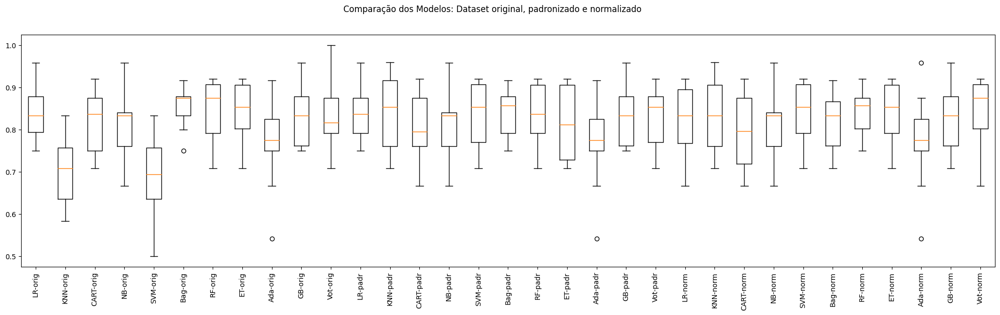

Melhor Resultado - Vot-norm: 0.842500 


In [102]:
# Montando os pipelines

# Dataset original
pipelines.append(('LR-orig',Pipeline([reg_log])))
pipelines.append(('KNN-orig',Pipeline([knn])))
pipelines.append(('CART-orig',Pipeline([cart])))
pipelines.append(('NB-orig',Pipeline([naives_bayes])))
pipelines.append(('SVM-orig',Pipeline([svm])))
pipelines.append(('Bag-orig',Pipeline([bagging])))
pipelines.append(('RF-orig',Pipeline([random_forest])))
pipelines.append(('ET-orig',Pipeline([extra_trees])))
pipelines.append(('Ada-orig',Pipeline([adaboost])))
pipelines.append(('GB-orig',Pipeline([gradient_boosting])))
pipelines.append(('Vot-orig',Pipeline([voting])))

# Dataset padronizado
pipelines.append(('LR-padr',Pipeline([standard_scaler,reg_log])))
pipelines.append(('KNN-padr',Pipeline([standard_scaler,knn])))
pipelines.append(('CART-padr',Pipeline([standard_scaler,cart])))
pipelines.append(('NB-padr',Pipeline([standard_scaler,naives_bayes])))
pipelines.append(('SVM-padr',Pipeline([standard_scaler,svm])))
pipelines.append(('Bag-padr',Pipeline([standard_scaler,bagging])))
pipelines.append(('RF-padr',Pipeline([standard_scaler,random_forest])))
pipelines.append(('ET-padr',Pipeline([standard_scaler,extra_trees])))
pipelines.append(('Ada-padr',Pipeline([standard_scaler,adaboost])))
pipelines.append(('GB-padr',Pipeline([standard_scaler,gradient_boosting])))
pipelines.append(('Vot-padr',Pipeline([standard_scaler,voting])))

# Dataset normalizado
pipelines.append(('LR-norm',Pipeline([min_max_scaler,reg_log])))
pipelines.append(('KNN-norm',Pipeline([min_max_scaler,knn])))
pipelines.append(('CART-norm',Pipeline([min_max_scaler,cart])))
pipelines.append(('NB-norm',Pipeline([min_max_scaler,naives_bayes])))
pipelines.append(('SVM-norm',Pipeline([min_max_scaler,svm])))
pipelines.append(('Bag-norm',Pipeline([min_max_scaler,bagging])))
pipelines.append(('RF-norm',Pipeline([min_max_scaler,random_forest])))
pipelines.append(('ET-norm',Pipeline([min_max_scaler,extra_trees])))
pipelines.append(('Ada-norm',Pipeline([min_max_scaler,adaboost])))
pipelines.append(('GB-norm',Pipeline([min_max_scaler,gradient_boosting])))
pipelines.append(('Vot-norm',Pipeline([min_max_scaler,voting])))

best_result=0
best_name=''
# Executando os pipelines
for name, model in pipelines:
  cv_results=cross_val_score(model,X_train,y_train,cv=kfold,scoring=scoring)
  results.append(cv_results)
  names.append(name)
  if best_result<cv_results.mean():
    best_result=cv_results.mean()
    best_name=name
  msg= '%s: %f (%f)' % (name,cv_results.mean(),cv_results.std())
  print(msg)

# Boxplot de comparação dos modelos
fig=plt.figure(figsize=(25,6))
fig.suptitle('Comparação dos Modelos: Dataset original, padronizado e normalizado')
ax= fig.add_subplot(111)
plt.boxplot(results)
ax.set_xticklabels(names,rotation=90)
plt.show()
print('Melhor Resultado - %s: %f ' % (name,cv_results.mean()))

Podemos perceber que após a validação cruzada, o melhor classificador foi o Vot-padr com 0.8425 de acurácia. Este classificador seguirá para a etapa de Tuning

####Tunning do Classificador

In [103]:
# Tuning do Voting
np.random.seed(7) # definindo semente global para este bloco

pipelines=[]

# Criando os modelos para o VotingClassifier
bases=[]
model1=LogisticRegression(max_iter=200)
bases.append(('logistic',model1))
model2=DecisionTreeClassifier()
bases.append(('cart',model2))
model3=SVC()
bases.append(('svm',model3))

# Definindo os componentes do pipeline
voting=('Voting',VotingClassifier(bases))
standard_scaler=('StandardScaler',StandardScaler())
min_max_scaler=('MinMaxScaler',MinMaxScaler())

pipelines.append(('Vot-orig',Pipeline([voting])))
pipelines.append(('Vot-padr',Pipeline([standard_scaler,voting])))
pipelines.append(('Vot-norm',Pipeline([min_max_scaler,voting])))

param_grid={
    'Voting__logistic__C': [0.1, 1, 10,100],
    'Voting__cart__max_depth': [None, 5, 10],
    'Voting__svm__C': [0.1, 1]
}

# Prepara e executa o GridSearchCV
best_score=0
for name, model in pipelines:
  grid=GridSearchCV(estimator=model,param_grid=param_grid,scoring=scoring,cv=kfold)
  grid.fit(X_train,y_train)
  #imprime a melhor configuração
  print('Sem tratamento de missings: %s - Melhor: %f usando %s' % (name,grid.best_score_, grid.best_params_))
  if best_score<grid.best_score_:
    best_score=grid.best_score_
    best_model=grid.best_estimator_


Sem tratamento de missings: Vot-orig - Melhor: 0.843167 usando {'Voting__cart__max_depth': 5, 'Voting__logistic__C': 1, 'Voting__svm__C': 1}
Sem tratamento de missings: Vot-padr - Melhor: 0.846667 usando {'Voting__cart__max_depth': 5, 'Voting__logistic__C': 0.1, 'Voting__svm__C': 1}
Sem tratamento de missings: Vot-norm - Melhor: 0.851000 usando {'Voting__cart__max_depth': None, 'Voting__logistic__C': 100, 'Voting__svm__C': 1}


In [104]:
best_model

Pipeline(steps=[('MinMaxScaler', MinMaxScaler()),
                ('Voting',
                 VotingClassifier(estimators=[('logistic',
                                               LogisticRegression(C=100,
                                                                  max_iter=200)),
                                              ('cart',
                                               DecisionTreeClassifier()),
                                              ('svm', SVC(C=1))]))])

Os melhores parâmetros para o VotingClassifier foi o utilizado no Vot-padr: CART max depth: None; logistic C: 100; e SVM C: 1. Este modelo foi guardado na variável **best_model**



####Avaliação do Conjunto teste

In [105]:
# Avaliação do modelo com conjunto de teste

# Preparação do modelo
scaler=StandardScaler().fit(X_train) # ajuste do scaler com o conjunto de treino
rescaledX=scaler.transform(X_train) # aplicação da padronização no conjunto de treino
best_model.fit(rescaledX,y_train)

# Estimativa da acurácia no conjunto de teste
rescaledTestX=scaler.transform(X_test) # aplicação da padronização no conjunto de teste
predictions=best_model.predict(rescaledTestX)
print(accuracy_score(y_test,predictions))

0.8032786885245902


In [106]:
# Matriz de Confusão
confusion_matrix(y_test,predictions)

array([[21,  7],
       [ 5, 28]])

Por se tratar de um conjunto de dados muito sensível, onde falsos positivos podem impactar um diagnóstico assertivo, a matriz de confusão demonstra que o modelo tem uma boa aderência associada a uma acurácia de 0.8033.

##2. Modelo utilizando Deep Learning para um problema de visão computacional (MVP 2.b)

O conjunto de dados "Natural Human Face Images for Emotion Recognition" é um dataset utilizado em problemas de visão computacional e tem como objetivo reconhecer emoções em rostos humanos. Ele contém imagens de rostos de pessoas em diferentes emoções, capturadas em condições naturais. Esse tipo de dataset é amplamente utilizado em pesquisas relacionadas à detecção e reconhecimento de emoções em imagens.

O reconhecimento de expressões faciais geralmente usa conjuntos de dados padrão como FER, CK+ e KDEF para aprendizado de máquina. Aqui está uma tentativa de fornecer dados adicionais para rostos humanos reais coletados na Internet e anotados manualmente.

São mais de 5.500 imagens com 8 categorias de emoções – raiva, desprezo, nojo, medo, felicidade, neutralidade, tristeza e surpresa. Todas as imagens contêm rosto humano em tons de cinza (ou esboço). Cada imagem tem 224 x 224 pixels em escala de cinza no formato PNG.

O reconhecimento de emoções em imagens de rostos humanos é uma tarefa desafiadora e importante em visão computacional. Essa habilidade é valiosa em aplicações como atendimento ao cliente, detecção de estresse e emoções em ambientes de trabalho, interações de robôs com humanos e análise de reações de consumidores em resposta a campanhas publicitárias, entre outras.

Fonte: O conjunto de dados pode ser proveniente de várias fontes, incluindo repositórios públicos, bancos de dados de pesquisa ou coletas de dados específicas para estudos de emoção em imagens de rostos humanos no kaggle (https://www.kaggle.com/datasets/sudarshanvaidya/random-images-for-face-emotion-recognition).

In [22]:
!pip install gdown # instala pacote do gdown para realizar download de arquivo no Google Drive

In [23]:
# importar bibliotecas

from keras.preprocessing.image import ImageDataGenerator
from keras import layers
from keras import models
from keras import optimizers
from keras.preprocessing import image
import os
import gdown
from sklearn.model_selection import train_test_split
import shutil
import random
import math
import numpy as np
import zipfile
import pandas as pd
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from datetime import datetime
from tensorflow import keras
from sklearn.metrics import classification_report
import sklearn.metrics as skm
import itertools
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import Image, display
from keras import regularizers
from keras.optimizers import Adam

In [63]:
# Utilidades
# plot_confusion_matrix é uma função python que imprime uma matriz de confusão

def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    Esta função imprime e plota a matriz de confusão.
    A normalização pode ser aplicada definindo `normalize=True`.
    """
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Matriz de confusão normalizada")
    else:
        print('Matriz de confusão sem normalização')

    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    fmt = '.2f' #if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('Label real')
    plt.xlabel('Label predito')

###1. Carga de Dados

In [25]:
file_id = "11ZvtedV401A3y2BFvCZcqd7fwPfuZCM_"
url = f"https://drive.google.com/uc?id={file_id}"

folder_path = "./dataset"  # especifique a pasta onde baixara o arquivo
os.makedirs(folder_path, exist_ok=True) # cria a pasta de destino se necessário

output = "dataset/emotions.zip"  # especifique o nome do arquivo e a extensão do mesmo
gdown.download(url, output)

Downloading...
From: https://drive.google.com/uc?id=11ZvtedV401A3y2BFvCZcqd7fwPfuZCM_
To: /content/dataset/emotions.zip
100%|██████████| 47.8M/47.8M [00:00<00:00, 54.7MB/s]


'dataset/emotions.zip'

In [26]:
# Path onde se encontra o arquivo 'emotions.zip'
train = 'dataset/emotions.zip'
destination = 'dataset/images/'

# Criando a pasta de destino se necessário
os.makedirs(destination,exist_ok=True)

# descompactação do arquivo emotions.zip na pasta de destino
with zipfile.ZipFile(train,'r') as zip_ref:
    zip_ref.extractall(destination)

###2. Análise dos Dados

In [27]:
# verifica a pasta de destino, focado no subdiretórios
subdir=os.listdir(destination)
print(subdir)

['contempt', 'surprise', 'fear', 'anger', 'disgust', 'happiness', 'sadness', 'neutrality']


In [28]:
# verifica cada subdiretório e conta quantos arquivos para cada pasta
for sub in subdir:
  print(sub+": "+str(len((os.listdir(destination+'/'+sub)))))

contempt: 208
surprise: 775
fear: 570
anger: 890
disgust: 439
happiness: 1406
sadness: 746
neutrality: 524


In [29]:
# construção de dataset com os dados dos arquivos
images, paths, labels, heights, widths, filesize = [], [], [], [], [],[]

for sub in subdir:
  path = destination+sub
  files = os.listdir(path)

  # Loop que percorre cada uma das imagens extraídas
  for fname in files:
      images.append(fname)
      paths.append(path+'/')
      labels.append(sub)
      img_shape = mpimg.imread(path+'/'+fname).shape
      heights.append(img_shape[0])
      widths.append(img_shape[1])
      filesize.append(os.path.getsize(path+'/'+fname))

      # copia os as imagens de cada subdiretório para o diretório de destino
      shutil.copy2(os.path.join(path, fname), destination)

# Criação do dataset
df = pd.DataFrame({'image': images, 'path': paths, 'class': labels,
                   'height': heights,'width': widths,  'filesize': filesize})

In [30]:
# visualização do dataset
df.head()

,image,path,class,height,width,filesize
0,images - 2020-11-06T181826.100_face.png,dataset/images/contempt/,contempt,224,224,10477
1,images - 2020-11-05T231423.965_face.png,dataset/images/contempt/,contempt,224,224,6716
2,images - 2020-11-06T185407.622_face.png,dataset/images/contempt/,contempt,224,224,8215
3,images - 2020-11-05T231407.586_face.png,dataset/images/contempt/,contempt,224,224,12503
4,images - 2020-11-06T005535.938_face.png,dataset/images/contempt/,contempt,224,224,11846


happiness     1406
anger          890
surprise       775
sadness        746
fear           570
neutrality     524
disgust        439
contempt       208
Name: class, dtype: int64


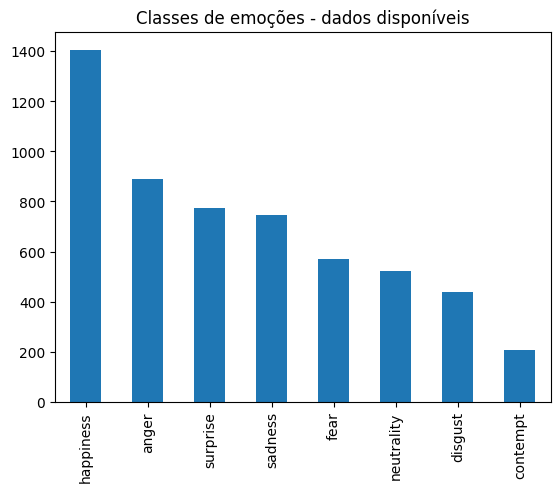

In [31]:
# avaliação dos dados através do dataset
print((df['class']).value_counts())
emotions_count = df['class'].value_counts().plot.bar(title='Classes de emoções - dados disponíveis')

Como podemos perceber, o dataset possui um desbalanceamento para cada classe, o que pode dificultar o treinamento do modelo.

###3. Pré-processamento dos dados

In [32]:
# parâmetros básicos que serão utilizados
batch_size = 32
img_height = 224
img_width = 224
num_classes = 8

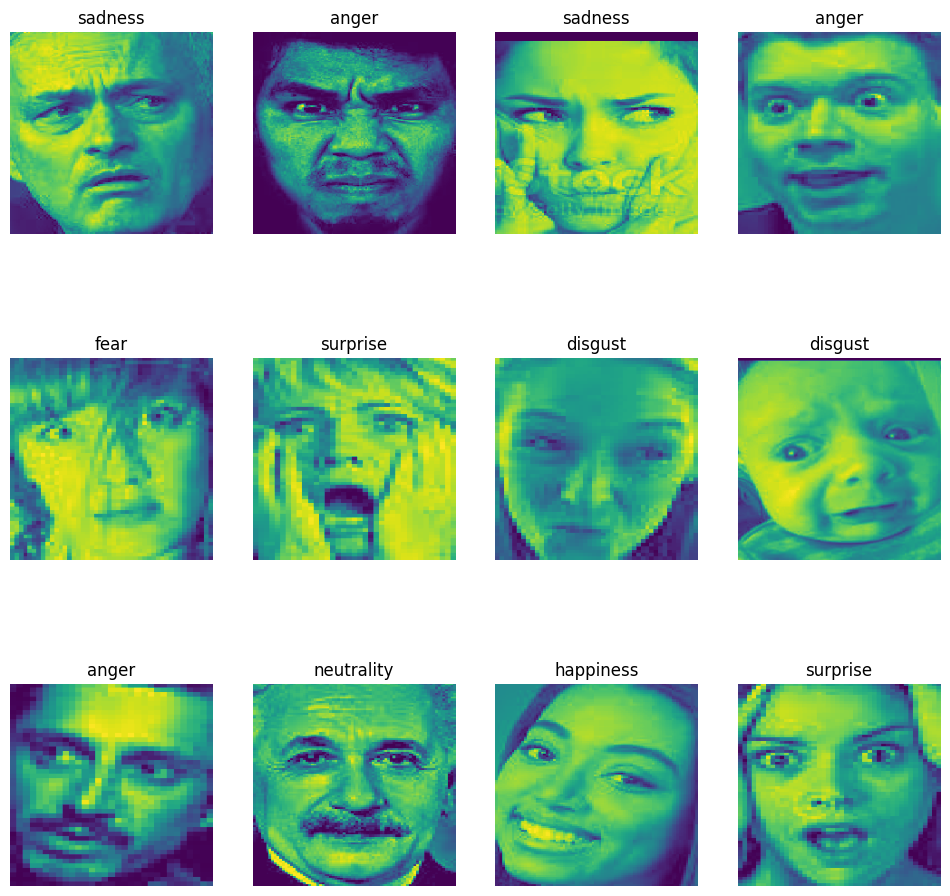

In [33]:
# Pré-visualização das imagens
fig = plt.gcf()
fig.set_size_inches(3*4, 3*4)

# Visualizando apenas 12 imagens
for i in range(12):

    sample = df.sample()
    img_path =sample['path'].values+'/'+sample['image'].values
    sp = plt.subplot(3, 4, i + 1)
    sp.axis('Off')
    img = mpimg.imread(img_path[0])
    plt.imshow(img)
    plt.title(sample['class'].values[0])

plt.show()

####Separação de conjunto de treino, validação e teste

In [34]:
train, test =train_test_split(df[['image' ,'path', 'class']] ,test_size=0.3 ,random_state=42 , stratify=df['class'],shuffle=True)

In [35]:
train_datagen=ImageDataGenerator(validation_split=0.2, #inclusa a divisão para validação
                                 rescale = 1.0/255,
                                 rotation_range=40,
                                 shear_range=0.2,
                                 zoom_range=0.2,
                                 horizontal_flip=True,
                                 fill_mode='nearest'
                                 )

test_datagen=ImageDataGenerator(rescale=1./255)


train_generator=train_datagen.flow_from_dataframe(
    train ,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    color_mode = "grayscale",
    class_mode='categorical',
    directory=destination,
    x_col='image',
    y_col='class',
    subset='training' #training set
    )

val_generator=train_datagen.flow_from_dataframe(
    train ,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    color_mode = "grayscale",
    class_mode='categorical',
    directory=destination,
    x_col='image',
    y_col='class',
    subset='validation' #validation set
    )

test_generator=test_datagen.flow_from_dataframe(
    test ,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    directory=destination,
    color_mode = "grayscale",
    class_mode='categorical',
    x_col='image',
    y_col='class',)

Found 3112 validated image filenames belonging to 8 classes.
Found 778 validated image filenames belonging to 8 classes.
Found 1668 validated image filenames belonging to 8 classes.


In [36]:
# verificação da ordem das classes para o modelo
test_generator.class_indices

{'anger': 0,
 'contempt': 1,
 'disgust': 2,
 'fear': 3,
 'happiness': 4,
 'neutrality': 5,
 'sadness': 6,
 'surprise': 7}

Found 1 validated image filenames belonging to 1 classes.


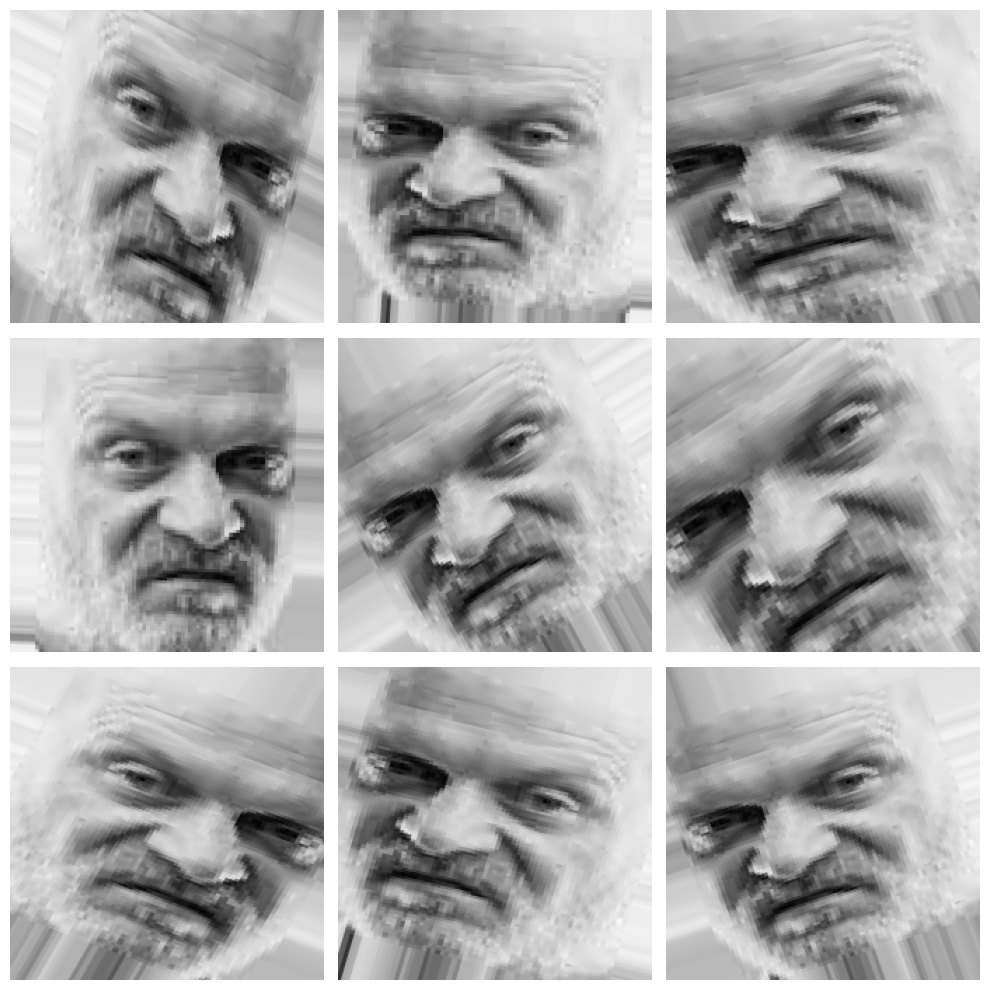

In [37]:
# Pegando um registro do dataframe
sample = df.sample(n=1)

# Neste caso o tipo de classe é categorico, pois temos um exemplo com apenas uma classe
sample_generator = train_datagen.flow_from_dataframe(
    sample,
    destination,
    x_col='image',
    y_col='class',
    target_size=(img_height, img_width),
    class_mode='categorical'
)

plt.figure(figsize=(10, 10))
for i in range(9):
    plt.subplot(3, 3, i+1)
    for x_batch, y_batch in sample_generator:
        image = x_batch[0]
        plt.imshow(image)
        plt.axis('Off')
        break
plt.tight_layout()
plt.show()

####Arquitetura do Modelo de Rede Neural Convulacional (CNN) para *Deep Learning*

A CNN consiste em três camadas convolucionais, seguidas de camadas de max pooling para extrair características das imagens. Após a terceira camada de max pooling, os recursos são achatados e passam por uma camada de dropout para reduzir o overfitting. Em seguida, há duas camadas densas, com 512 neurônios cada, aplicando a função de ativação 'relu'. Outra camada de dropout é usada antes da camada de saída, que possui um número de neurônios igual ao número de classes, usando a função 'softmax' para prever a classe de saída.

In [38]:
model = keras.models.Sequential([
    keras.layers.Conv2D(64, (3,3), activation='relu', input_shape=(img_height,img_width,1)), # camada convolucional que usa 64 filtros (ou kernels) de tamanho 3x3 com função de ativação ReLu
    keras.layers.MaxPooling2D((2,2)), # camada de redução da resolução da imagem.
    keras.layers.Conv2D(128, (3,3), activation='relu'), # camada convolucional oculta que usa 128 filtros (ou kernels) de tamanho 3x3 com função de ativação ReLu
    keras.layers.MaxPooling2D((2,2)), # camada de redução da resolução da imagem.
    keras.layers.Conv2D(256, (3,3), activation='relu'), # camada convolucional oculta que usa 256 filtros (ou kernels) de tamanho 3x3 com função de ativação ReLu
    keras.layers.MaxPooling2D((2,2)), # camada de redução da resolução da imagem.
    keras.layers.Flatten(), # Esta camada achatou (flatten) os recursos extraídos pelas camadas convolucionais e de max pooling
    keras.layers.Dropout(0.2), # Uma camada de dropout é adicionada para evitar o overfitting. Ela descarta aleatoriamente 20% das unidades durante o treinamento.
    keras.layers.Dense(512, activation='relu'), # camada densa (fully connected) com 512 neurônios.
    keras.layers.Dropout(0.2), # Uma camada de dropout é adicionada para evitar o overfitting. Ela descarta aleatoriamente 20% das unidades durante o treinamento.
    keras.layers.Dense(num_classes, activation='softmax') # A camada de saída é uma camada densa com um número de neurônios igual ao número de classes. A função de ativação 'softmax' é usada para transformar as saídas em probabilidades para cada classe.
])

In [40]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 222, 222, 64)      640       
                                                                 
 max_pooling2d (MaxPooling2  (None, 111, 111, 64)      0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 109, 109, 128)     73856     
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 54, 54, 128)       0         
 g2D)                                                            
                                                                 
 conv2d_2 (Conv2D)           (None, 52, 52, 256)       295168    
                                                                 
 max_pooling2d_2 (MaxPoolin  (None, 26, 26, 256)       0

####Treinamento do Modelo Deep Learning

Compilação do modelo Keras com as configurações do treinamento.

optimizer='adam': especifica o otimizador a ser usado durante o treinamento.

loss='categorical_crossentropy': especifica a função de perda a ser usada durante o treinamento. Para problemas de classificação multiclasse, onde a variável alvo tem mais de duas categorias, a perda categórica de entropia cruzada é freqüentemente empregada.

metrics=['accuracy']: especifica as métricas de avaliação a serem usadas durante o treinamento e o teste.

In [41]:
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

epochs = 5 define o número de épocas de treinamento para o modelo. Uma época representa uma passagem completa por todo o conjunto de dados de treinamento. Foi escolhido o pequeno número de épocas para fins didáticos.

Já o método fit() inicia o processo de treinamento do modelo usando o número especificado de épocas.

In [42]:
history=model.fit(train_generator ,
                            #steps_per_epoch=150,
                            epochs=5,
                            validation_data=val_generator ,
                            validation_steps=10
                            )

Epoch 1/5
98/98 [==============================] - 1097s 11s/step - loss: 2.0597 - accuracy: 0.2272 - val_loss: 1.9450 - val_accuracy: 0.2594
Epoch 2/5
98/98 [==============================] - 1071s 11s/step - loss: 1.9688 - accuracy: 0.2506 - val_loss: 1.9544 - val_accuracy: 0.2594
Epoch 3/5
98/98 [==============================] - 1070s 11s/step - loss: 1.9276 - accuracy: 0.2670 - val_loss: 1.8521 - val_accuracy: 0.3125
Epoch 4/5
98/98 [==============================] - 1088s 11s/step - loss: 1.8656 - accuracy: 0.2898 - val_loss: 1.8114 - val_accuracy: 0.3063
Epoch 5/5
98/98 [==============================] - 1039s 11s/step - loss: 1.8437 - accuracy: 0.3066 - val_loss: 1.8631 - val_accuracy: 0.3125


####Execução do modelo de deep learning treinado em cada uma das imagens de teste

1/1 [==============================] - 3s 3s/step


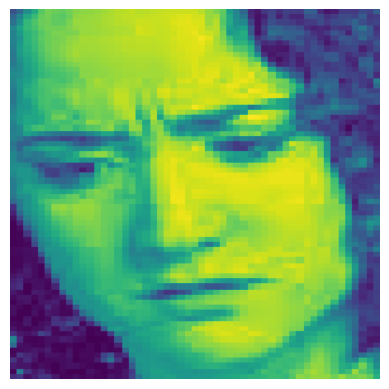

Label:  sadness
Previsão:  happiness
Probabilidade:  0.29196408


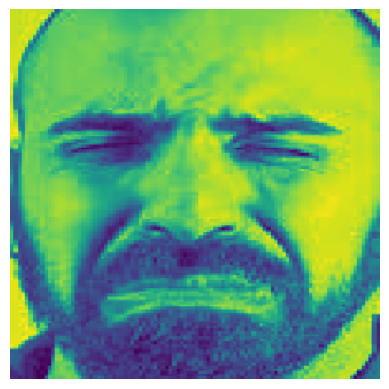

Label:  sadness
Previsão:  anger
Probabilidade:  0.21916658


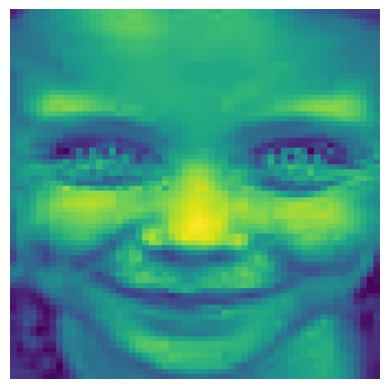

Label:  anger
Previsão:  happiness
Probabilidade:  0.29014167


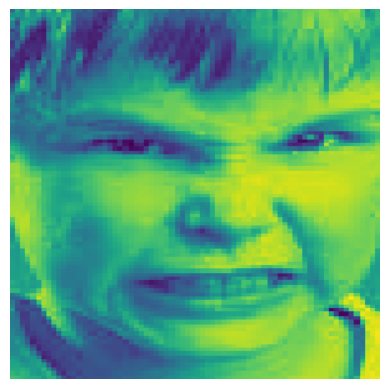

Label:  anger
Previsão:  happiness
Probabilidade:  0.18574198


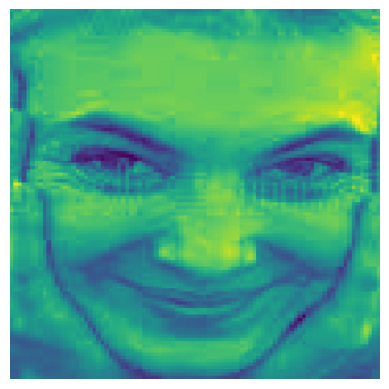

Label:  happiness
Previsão:  happiness
Probabilidade:  0.20198059


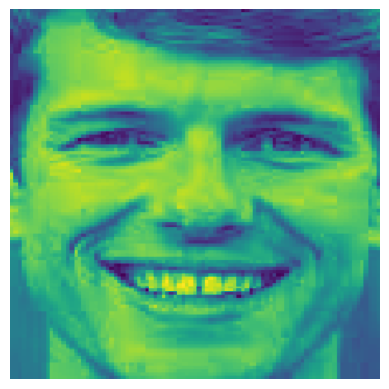

Label:  happiness
Previsão:  happiness
Probabilidade:  0.39715374


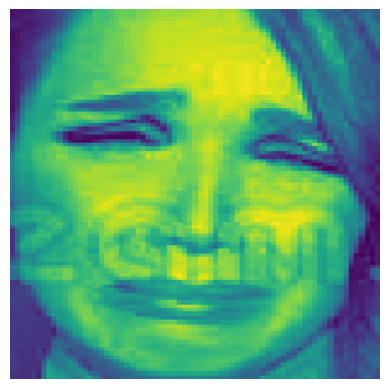

Label:  fear
Previsão:  happiness
Probabilidade:  0.2429048


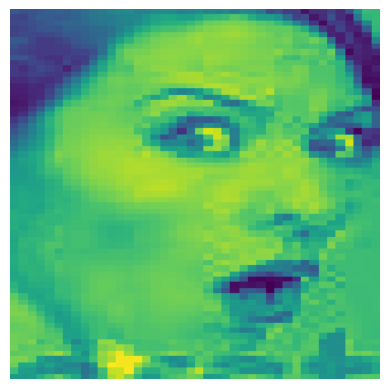

Label:  fear
Previsão:  surprise
Probabilidade:  0.19991483


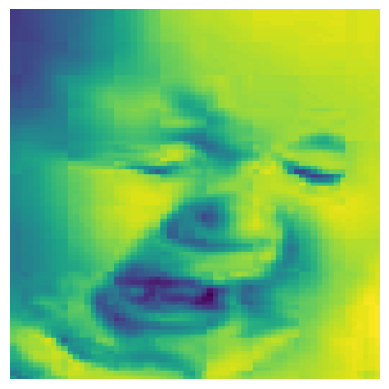

Label:  disgust
Previsão:  happiness
Probabilidade:  0.20039916


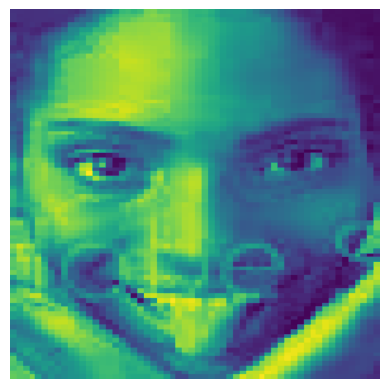

Label:  happiness
Previsão:  sadness
Probabilidade:  0.20010228


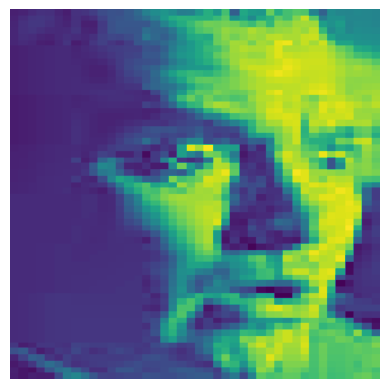

Label:  fear
Previsão:  happiness
Probabilidade:  0.2571072


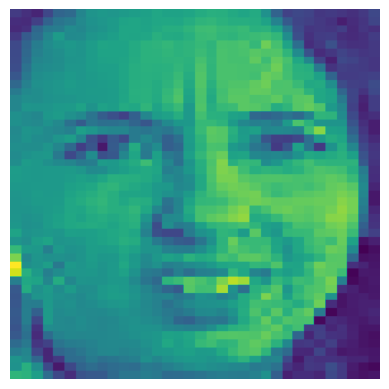

Label:  anger
Previsão:  happiness
Probabilidade:  0.21892512


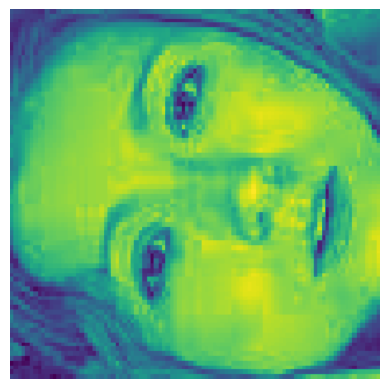

Label:  neutrality
Previsão:  happiness
Probabilidade:  0.20159058


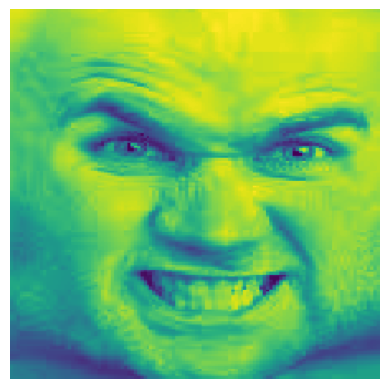

Label:  anger
Previsão:  happiness
Probabilidade:  0.28574145


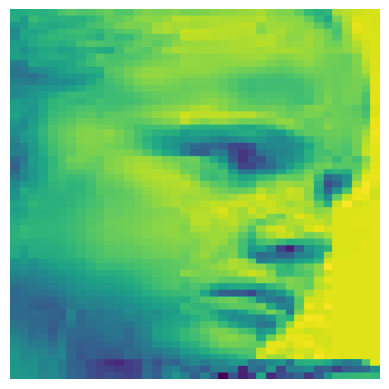

Label:  sadness
Previsão:  happiness
Probabilidade:  0.2780401


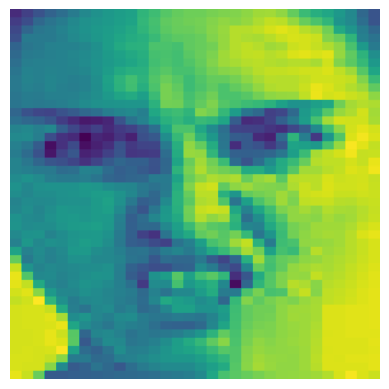

Label:  anger
Previsão:  anger
Probabilidade:  0.22633332


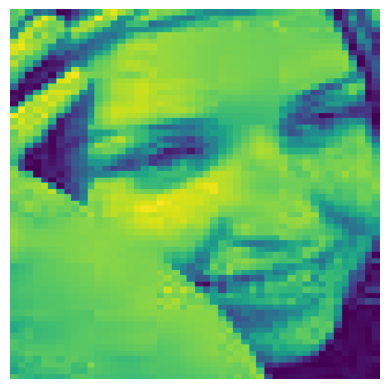

Label:  happiness
Previsão:  happiness
Probabilidade:  0.1962984


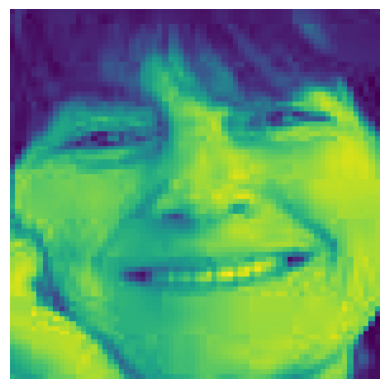

Label:  happiness
Previsão:  happiness
Probabilidade:  0.2323469


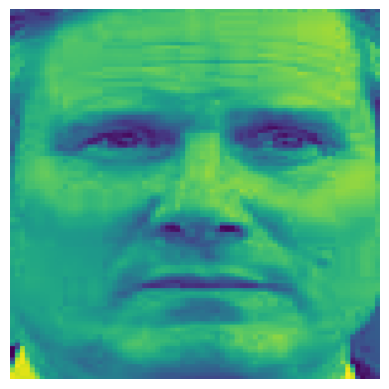

Label:  disgust
Previsão:  anger
Probabilidade:  0.19948414


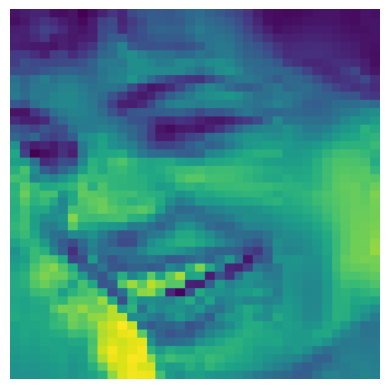

Label:  happiness
Previsão:  happiness
Probabilidade:  0.22251429


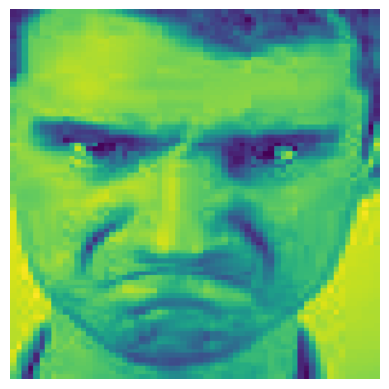

Label:  anger
Previsão:  anger
Probabilidade:  0.21182472


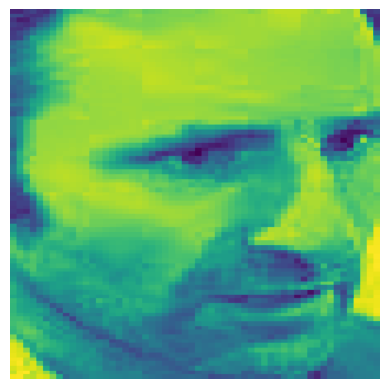

Label:  anger
Previsão:  anger
Probabilidade:  0.18935454


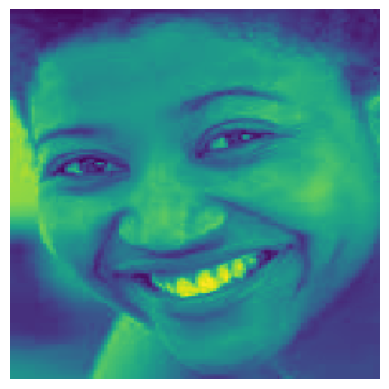

Label:  happiness
Previsão:  happiness
Probabilidade:  0.27134478


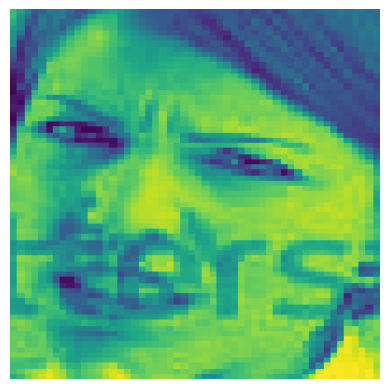

Label:  anger
Previsão:  happiness
Probabilidade:  0.22903548


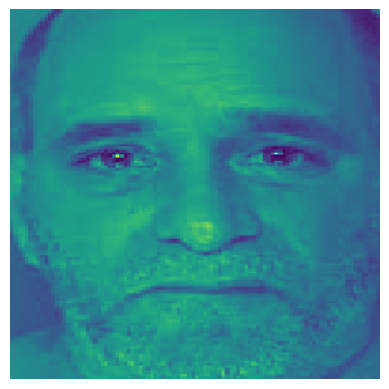

Label:  sadness
Previsão:  happiness
Probabilidade:  0.19727884


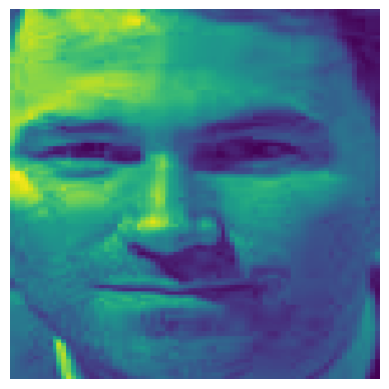

Label:  sadness
Previsão:  anger
Probabilidade:  0.21615487


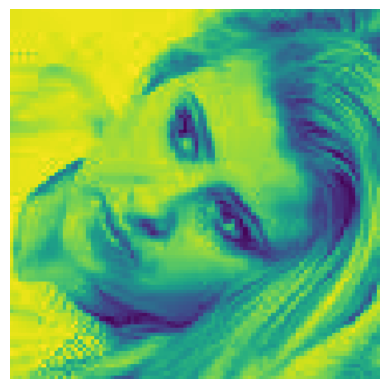

Label:  sadness
Previsão:  surprise
Probabilidade:  0.18709038


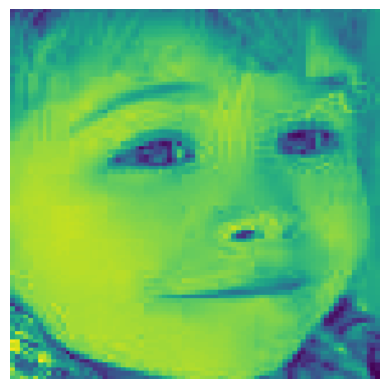

Label:  surprise
Previsão:  happiness
Probabilidade:  0.18289666


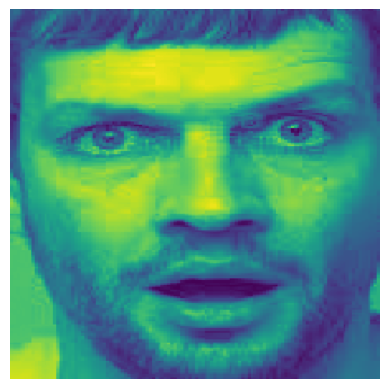

Label:  surprise
Previsão:  surprise
Probabilidade:  0.30022386


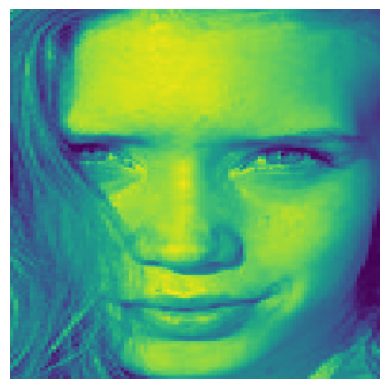

Label:  neutrality
Previsão:  happiness
Probabilidade:  0.22793429


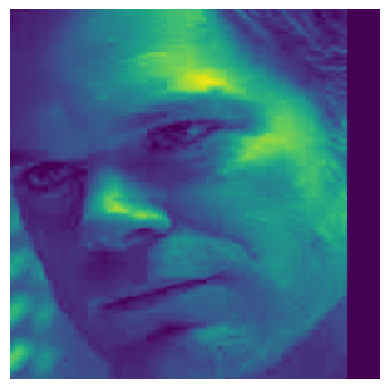

Label:  anger
Previsão:  sadness
Probabilidade:  0.26719466


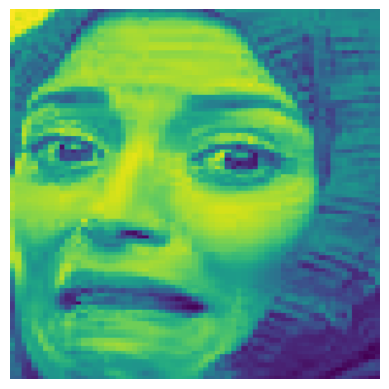

Label:  disgust
Previsão:  sadness
Probabilidade:  0.16958727
1/1 [==============================] - 4s 4s/step


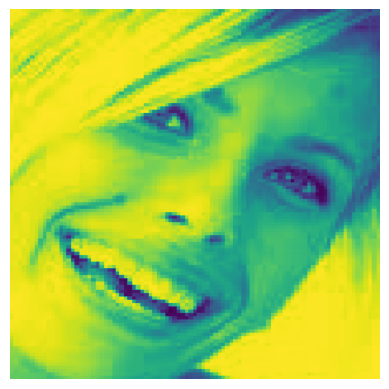

Label:  happiness
Previsão:  happiness
Probabilidade:  0.45100126


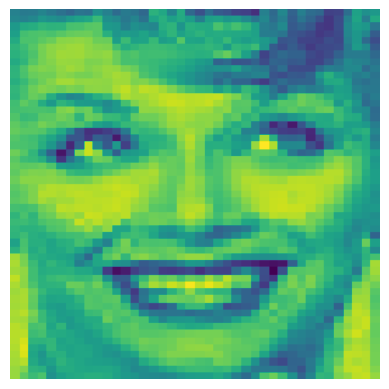

Label:  happiness
Previsão:  happiness
Probabilidade:  0.43806633


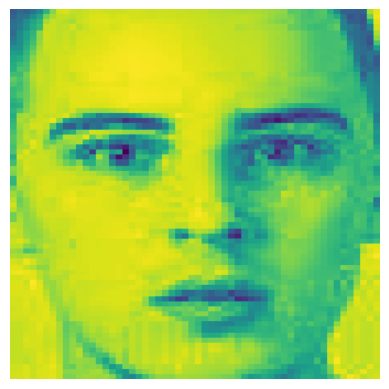

Label:  fear
Previsão:  anger
Probabilidade:  0.19596545


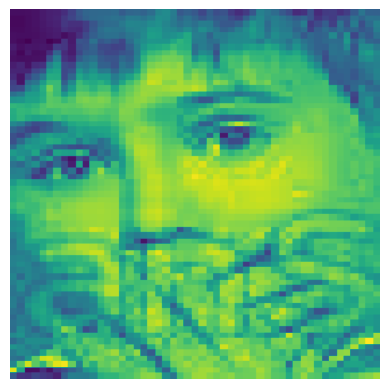

Label:  surprise
Previsão:  anger
Probabilidade:  0.15928902


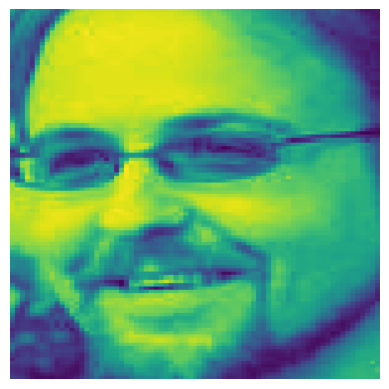

Label:  happiness
Previsão:  happiness
Probabilidade:  0.22282721


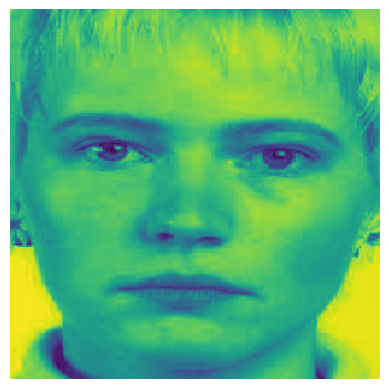

Label:  disgust
Previsão:  happiness
Probabilidade:  0.17885832


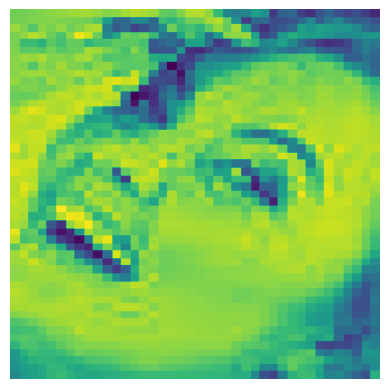

Label:  happiness
Previsão:  happiness
Probabilidade:  0.3331552


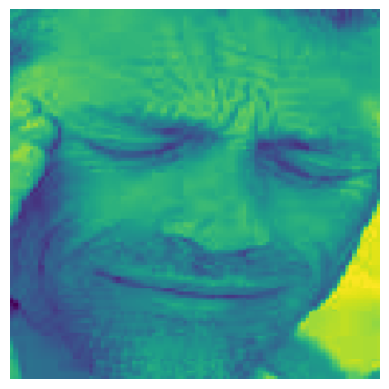

Label:  sadness
Previsão:  happiness
Probabilidade:  0.2015008


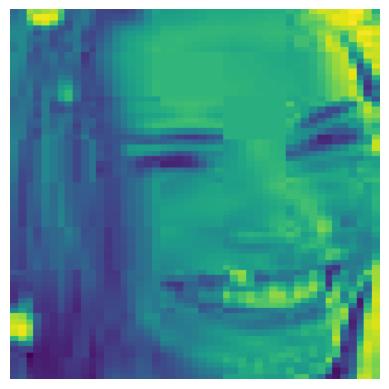

Label:  happiness
Previsão:  happiness
Probabilidade:  0.20142572


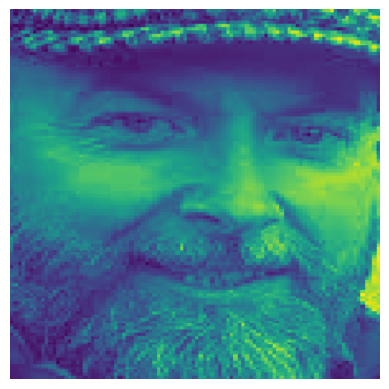

Label:  happiness
Previsão:  happiness
Probabilidade:  0.19065621


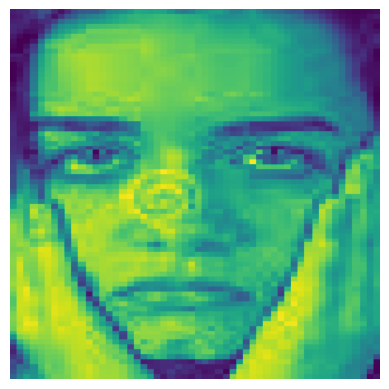

Label:  sadness
Previsão:  neutrality
Probabilidade:  0.19673064


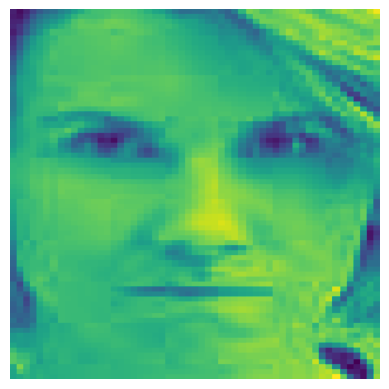

Label:  anger
Previsão:  happiness
Probabilidade:  0.23333131


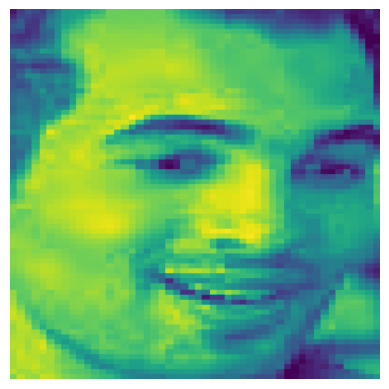

Label:  happiness
Previsão:  anger
Probabilidade:  0.21400736


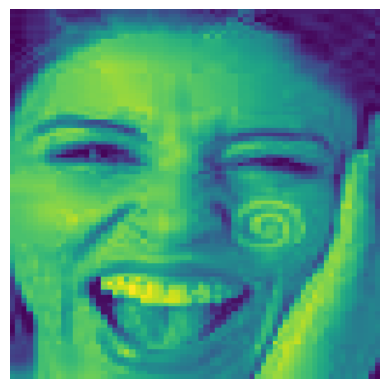

Label:  happiness
Previsão:  happiness
Probabilidade:  0.24215573


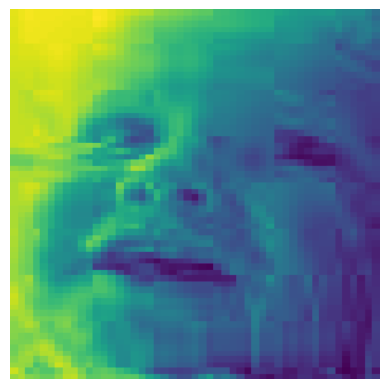

Label:  happiness
Previsão:  happiness
Probabilidade:  0.20098117


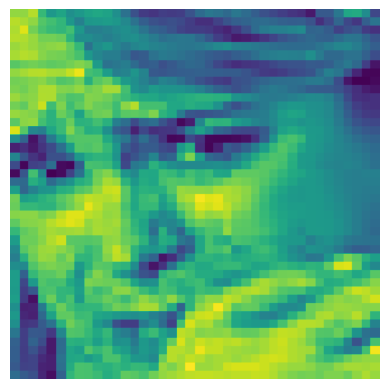

Label:  fear
Previsão:  anger
Probabilidade:  0.2005203


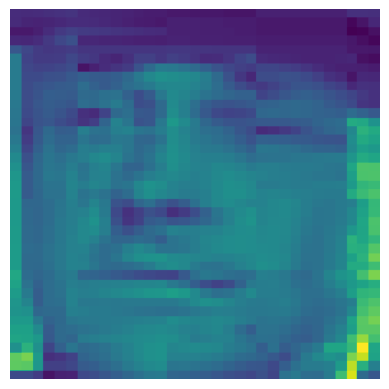

Label:  disgust
Previsão:  sadness
Probabilidade:  0.20813514


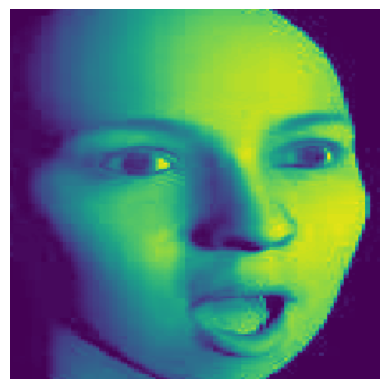

Label:  neutrality
Previsão:  sadness
Probabilidade:  0.23732433


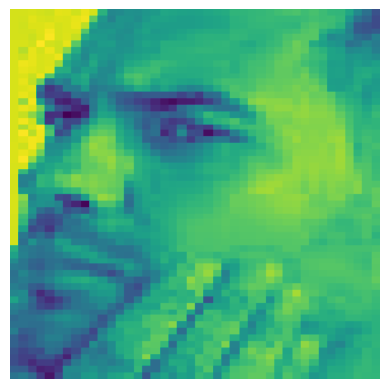

Label:  surprise
Previsão:  happiness
Probabilidade:  0.17981005


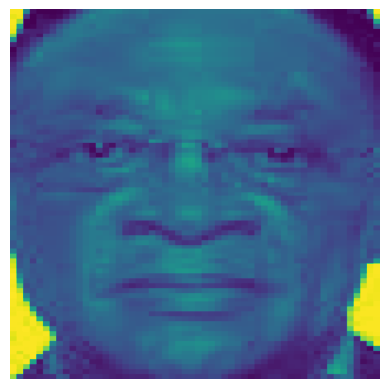

Label:  neutrality
Previsão:  neutrality
Probabilidade:  0.19659421


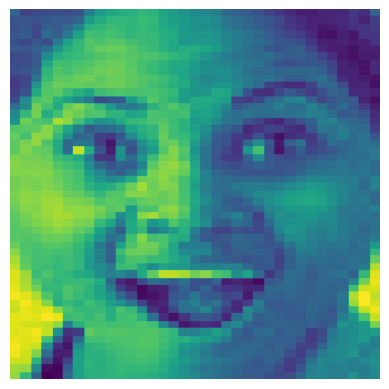

Label:  surprise
Previsão:  surprise
Probabilidade:  0.37521487


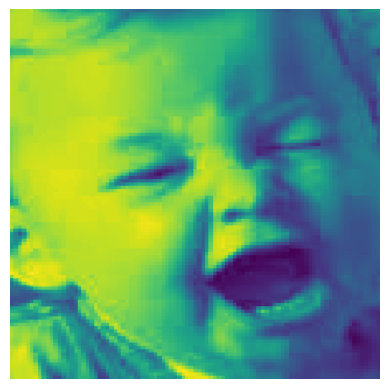

Label:  disgust
Previsão:  surprise
Probabilidade:  0.19767591


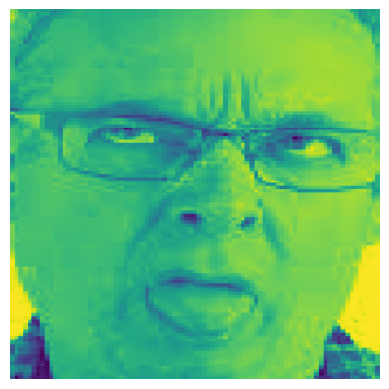

Label:  disgust
Previsão:  anger
Probabilidade:  0.15980984


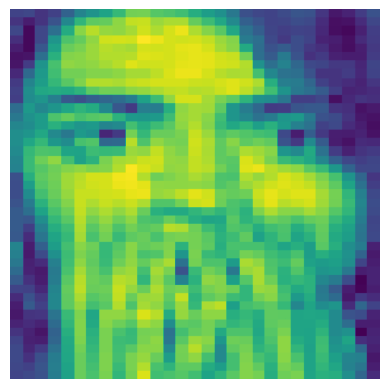

Label:  fear
Previsão:  neutrality
Probabilidade:  0.21191953


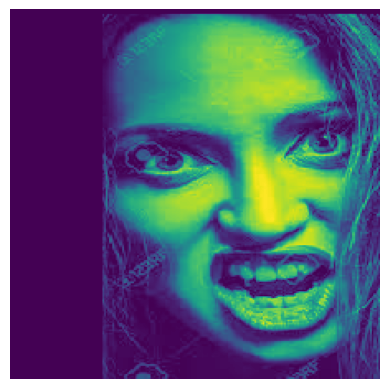

Label:  anger
Previsão:  sadness
Probabilidade:  0.24515378


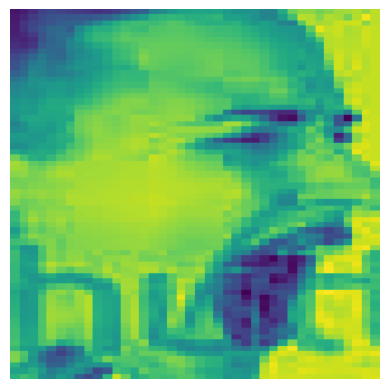

Label:  anger
Previsão:  happiness
Probabilidade:  0.2107518


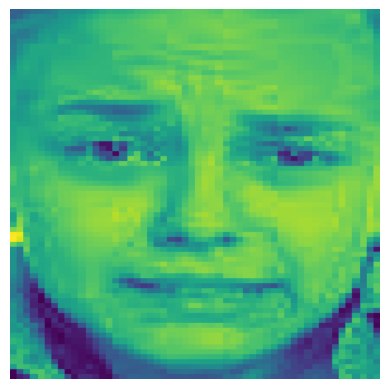

Label:  fear
Previsão:  happiness
Probabilidade:  0.22696395


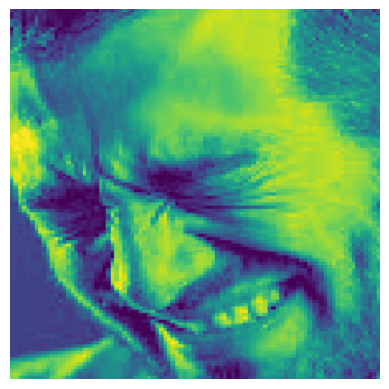

Label:  sadness
Previsão:  happiness
Probabilidade:  0.30436274


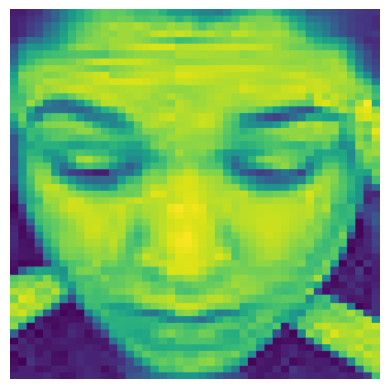

Label:  sadness
Previsão:  happiness
Probabilidade:  0.22492757


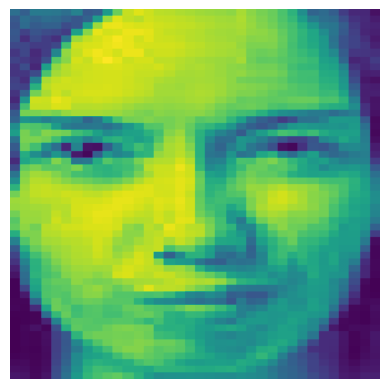

Label:  contempt
Previsão:  happiness
Probabilidade:  0.2541443


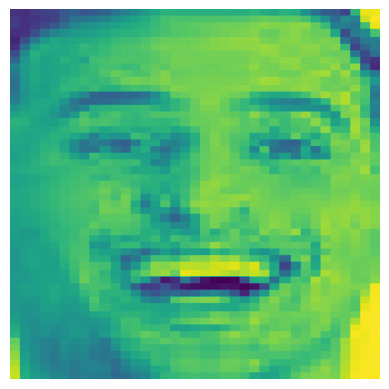

Label:  contempt
Previsão:  surprise
Probabilidade:  0.41620994


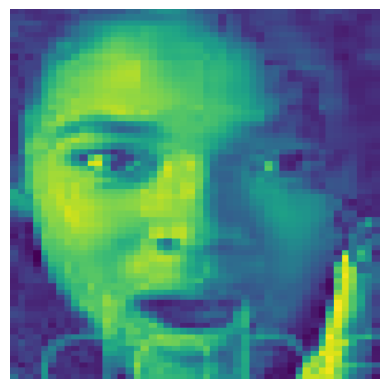

Label:  surprise
Previsão:  fear
Probabilidade:  0.17968819


In [43]:
count = 0
y_pred = list()
y_true = list()
class_names = ['anger','contempt','disgust','fear','happiness','neutrality','sadness','surprise']

# Loop do data generator de teste que contem as imagens
for batch in test_generator:

    count+=1

    # Condição de saída do loop. Só executaremos o modelo em algumas imagens
    if count == 3:
        break

    else:

        # Pegando a imagem e o label
        images = batch[0]
        labels = batch[1]

        # Previsão
        predictions = model.predict(images)

        # Visualização da imagem
        for i in range(len(images)):

            image = images[i]
            label = labels[i]
            prediction = predictions[i]

            # Converte o array de previsão para visualizar a classe e a probabilidade
            predicted_class = np.argmax(prediction)
            probability = prediction[predicted_class]
            label = class_names[np.argmax(label)]
            y_true.append(label)

            # Faz o DE-PARA da probabilidade com o tipo de classe da previsão
            dict_class={
                0: 'anger',
                1: 'contempt',
                2: 'disgust',
                3: 'fear',
                4: 'happiness',
                5: 'neutrality',
                6: 'sadness',
                7: 'surprise'
            }


            class_name = dict_class.get(predicted_class)
            y_pred.append(class_name)

            # Configura a saída das imagens que serão visualizadas
            plt.imshow(images[i])
            plt.axis('Off')
            plt.show()

            # Imprime os resultados da classificação das images
            print("Label: ", label)
            print("Previsão: ", class_name)
            print("Probabilidade: ", probability)

In [44]:
# Calculando as métricas
accuracy = skm.accuracy_score(y_true, y_pred)
precision = skm.precision_score(y_true, y_pred, average='weighted')
recall = skm.recall_score(y_true, y_pred, average='weighted')
f1score = skm.f1_score(y_true, y_pred, average='weighted')

print("Accuracy: ", accuracy)
print("Precision: ", precision)
print("Recall: ", recall)
print("F1 Score: ", f1score)

Accuracy:  0.3125
Precision:  0.1978142915642916
Recall:  0.3125
F1 Score:  0.23009565803351692


Matriz de confusão sem normalização


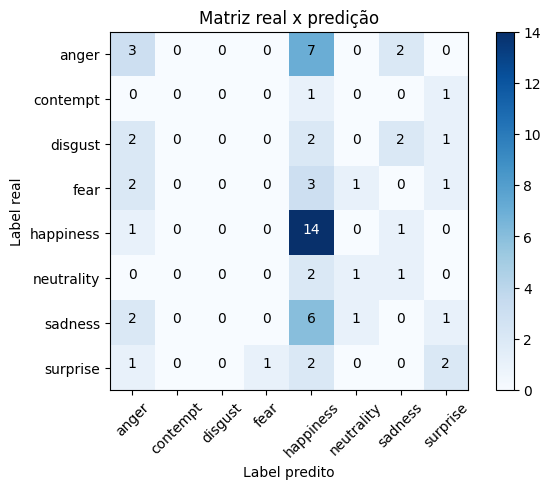

In [48]:
from sklearn.metrics import accuracy_score, confusion_matrix

cnf_matrix = confusion_matrix(y_true, y_pred, labels=class_names)
np.set_printoptions(precision=2)

plt.figure()
plot_confusion_matrix(cnf_matrix,
                      classes=['anger',
                               'contempt',
                               'disgust',
                               'fear',
                               'happiness',
                               'neutrality',
                               'sadness',
                               'surprise'],
                      normalize= False,
                      title='Matriz real x predição')

In [50]:
# obtendo a data e hora atual
now = datetime.now()

# Definição do formato
format = '%Y-%m-%dT%H%M'

# Converter a data e hora em uma string com o formato especificado
formatted_datetime = now.strftime(format)

path_model = 'dataset/emotions/trained_models'

name_model = 'trained_model_' + formatted_datetime + '.h5'

# salvando o modelo
model.save("%s/%s" % (path_model, name_model))
print("Modelo salvo com o nome: ", name_model)

Modelo salvo com o nome:  trained_model_2023-10-22T2149.h5


In [51]:
loaded_model = keras.models.load_model("%s/%s" % (path_model, name_model))
print("Modelo %s carregado com sucesso" % (name_model))

Modelo trained_model_2023-10-22T2149.h5 carregado com sucesso


1/1 [==============================] - 3s 3s/step


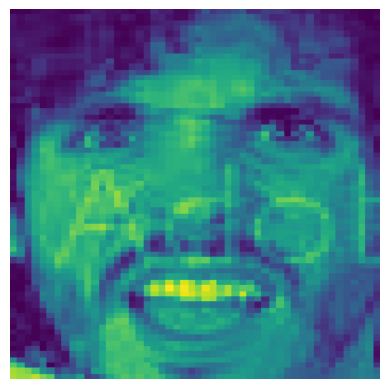

Label:  anger
Previsão:  happiness
Probabilidade:  0.28184482


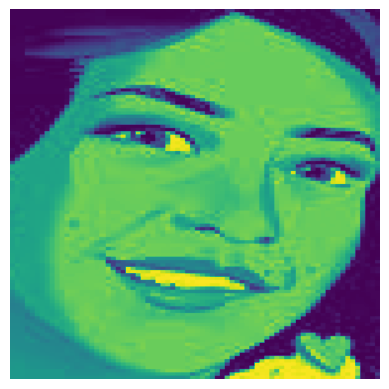

Label:  happiness
Previsão:  happiness
Probabilidade:  0.23758018


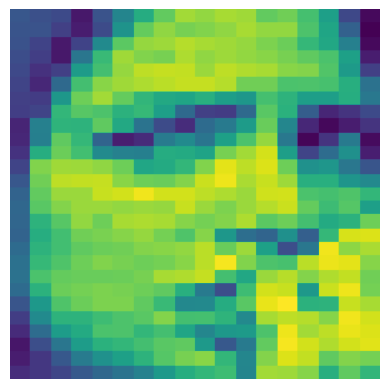

Label:  fear
Previsão:  happiness
Probabilidade:  0.24162765


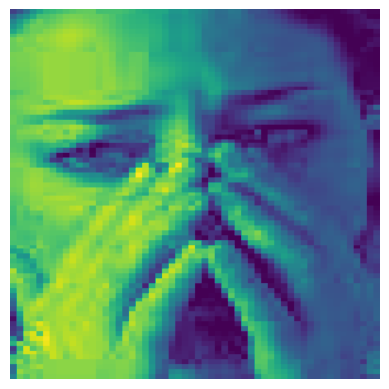

Label:  sadness
Previsão:  neutrality
Probabilidade:  0.27589378


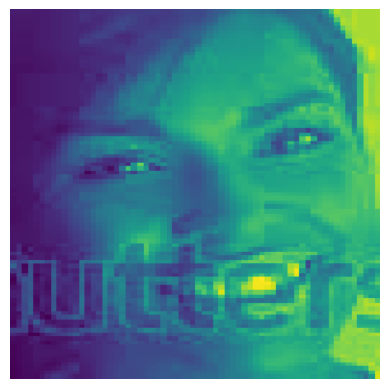

Label:  happiness
Previsão:  happiness
Probabilidade:  0.21667598


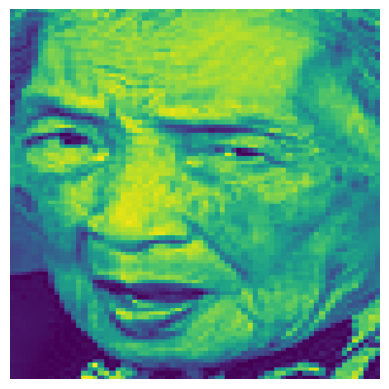

Label:  neutrality
Previsão:  happiness
Probabilidade:  0.22779681


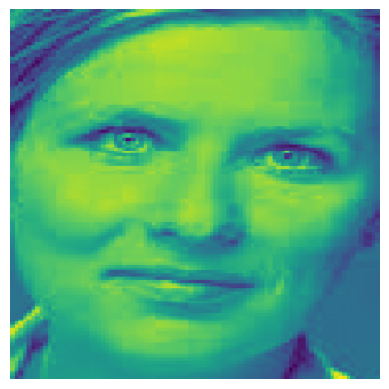

Label:  neutrality
Previsão:  happiness
Probabilidade:  0.20636314


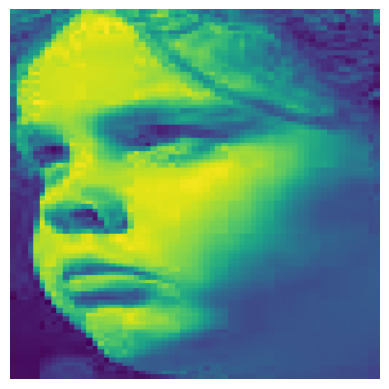

Label:  anger
Previsão:  happiness
Probabilidade:  0.2120533


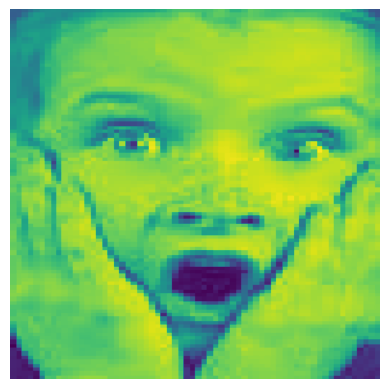

Label:  surprise
Previsão:  surprise
Probabilidade:  0.52839357


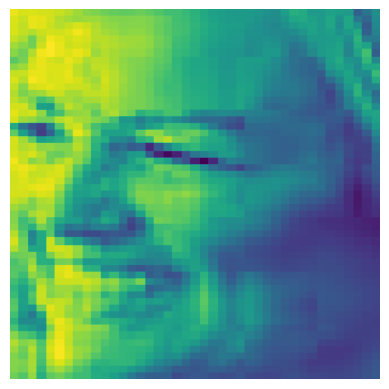

Label:  happiness
Previsão:  sadness
Probabilidade:  0.1682317


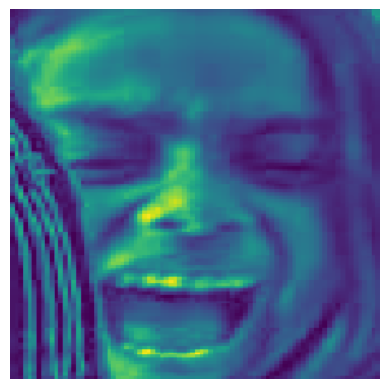

Label:  sadness
Previsão:  sadness
Probabilidade:  0.22704251


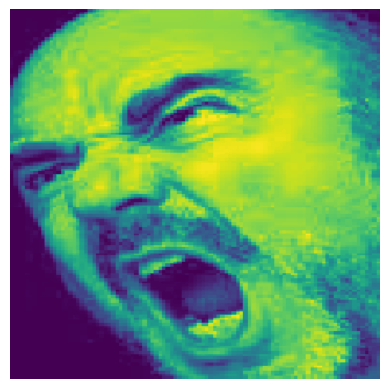

Label:  anger
Previsão:  surprise
Probabilidade:  0.4377477


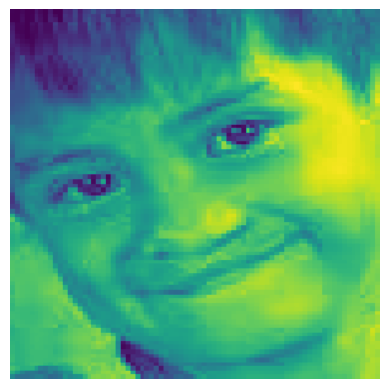

Label:  fear
Previsão:  happiness
Probabilidade:  0.19399534


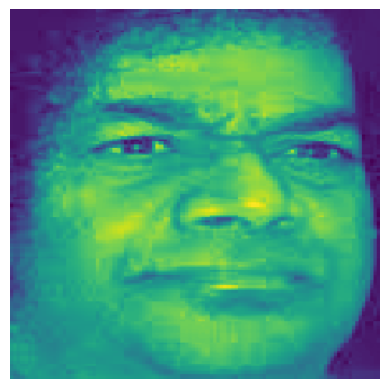

Label:  anger
Previsão:  happiness
Probabilidade:  0.18824916


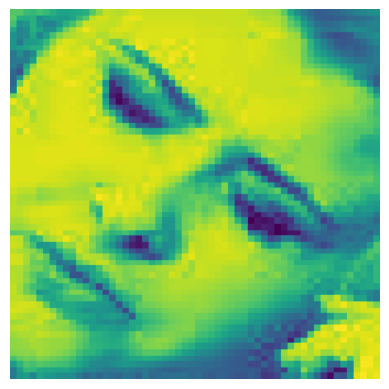

Label:  sadness
Previsão:  happiness
Probabilidade:  0.25848457


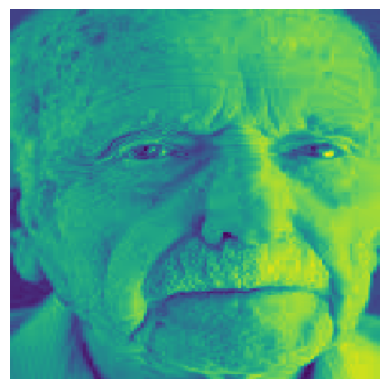

Label:  neutrality
Previsão:  happiness
Probabilidade:  0.2774506


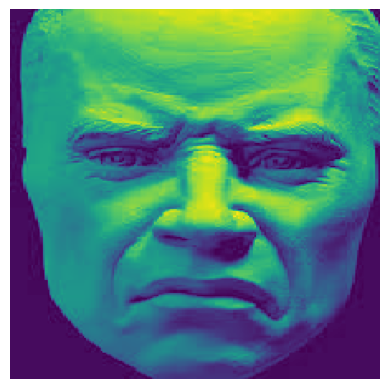

Label:  disgust
Previsão:  anger
Probabilidade:  0.22005643


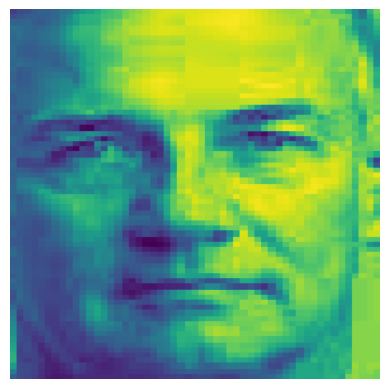

Label:  neutrality
Previsão:  anger
Probabilidade:  0.20537782


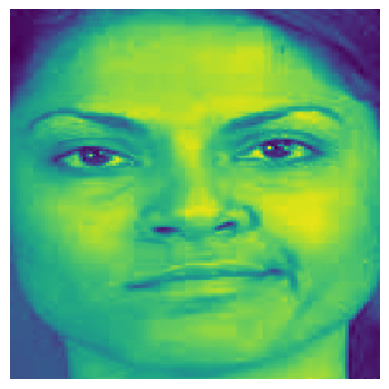

Label:  contempt
Previsão:  neutrality
Probabilidade:  0.17538191


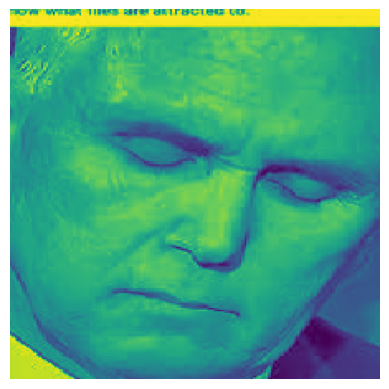

Label:  sadness
Previsão:  happiness
Probabilidade:  0.2110644


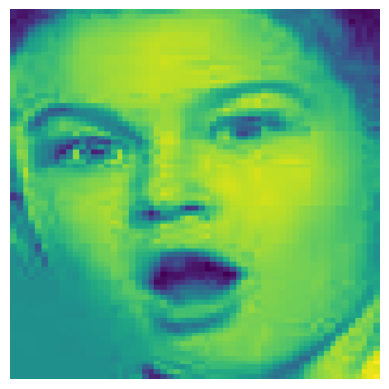

Label:  surprise
Previsão:  surprise
Probabilidade:  0.37156424


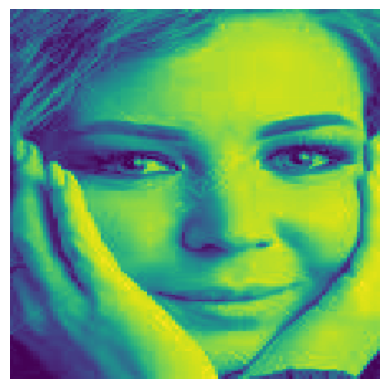

Label:  happiness
Previsão:  happiness
Probabilidade:  0.21433337


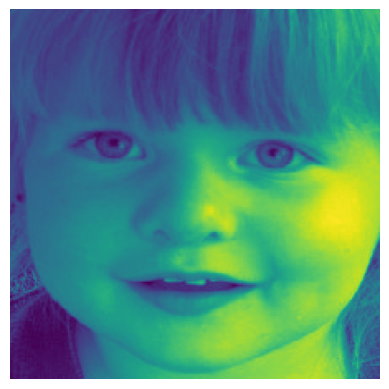

Label:  happiness
Previsão:  happiness
Probabilidade:  0.20897083


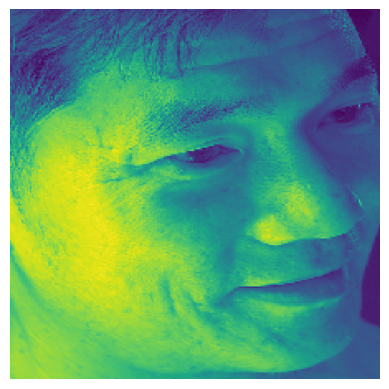

Label:  happiness
Previsão:  anger
Probabilidade:  0.18544918


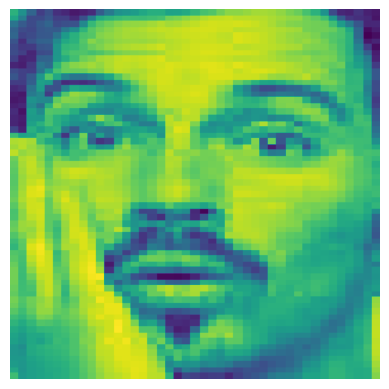

Label:  surprise
Previsão:  surprise
Probabilidade:  0.39468852


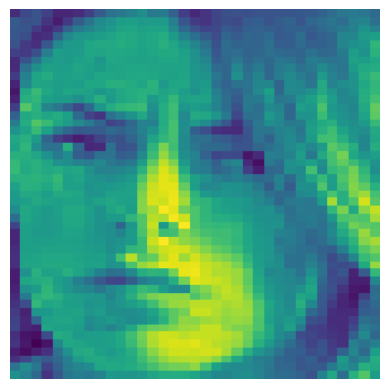

Label:  anger
Previsão:  happiness
Probabilidade:  0.19789994


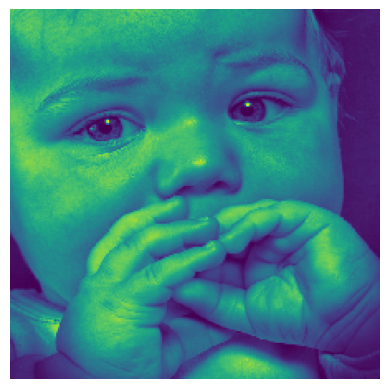

Label:  sadness
Previsão:  fear
Probabilidade:  0.20548455


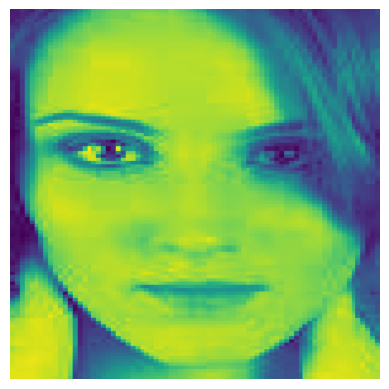

Label:  neutrality
Previsão:  happiness
Probabilidade:  0.16574356


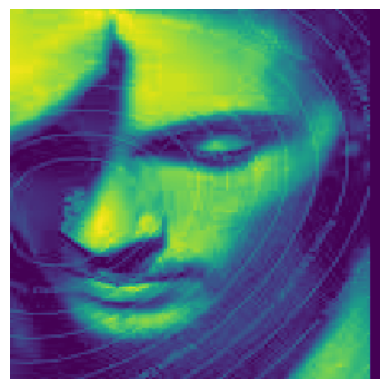

Label:  sadness
Previsão:  sadness
Probabilidade:  0.30602053


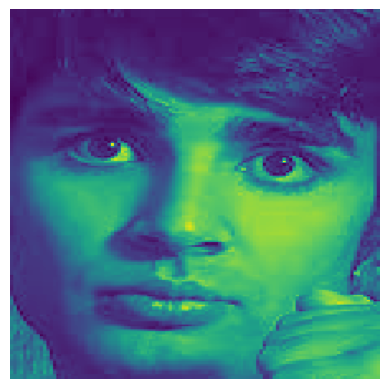

Label:  surprise
Previsão:  neutrality
Probabilidade:  0.23896971


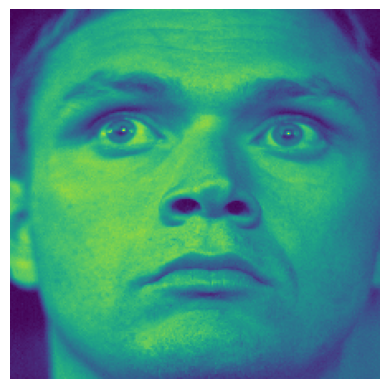

Label:  fear
Previsão:  neutrality
Probabilidade:  0.23559767


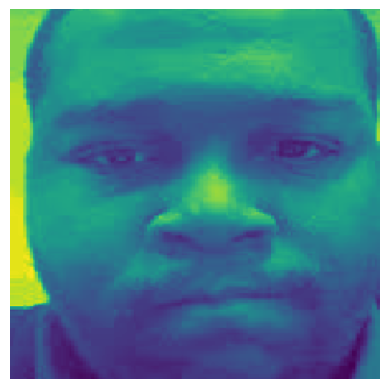

Label:  anger
Previsão:  sadness
Probabilidade:  0.188699
1/1 [==============================] - 5s 5s/step


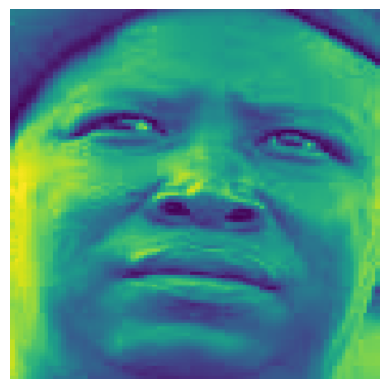

Label:  neutrality
Previsão:  fear
Probabilidade:  0.17431551


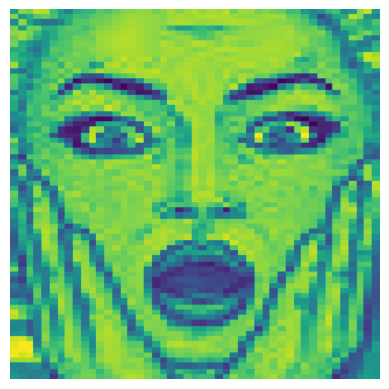

Label:  surprise
Previsão:  surprise
Probabilidade:  0.43874395


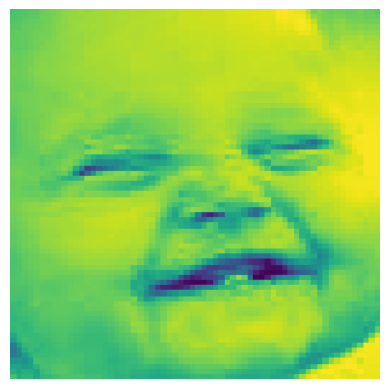

Label:  surprise
Previsão:  surprise
Probabilidade:  0.40572175


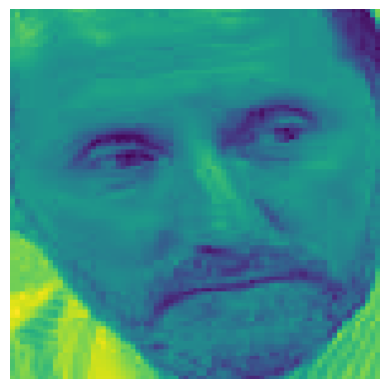

Label:  sadness
Previsão:  anger
Probabilidade:  0.20184149


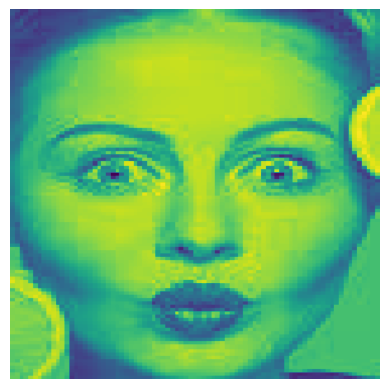

Label:  surprise
Previsão:  happiness
Probabilidade:  0.21392937


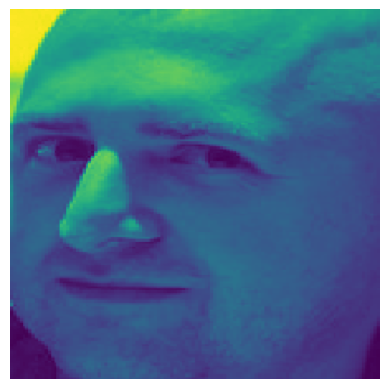

Label:  neutrality
Previsão:  sadness
Probabilidade:  0.19038202


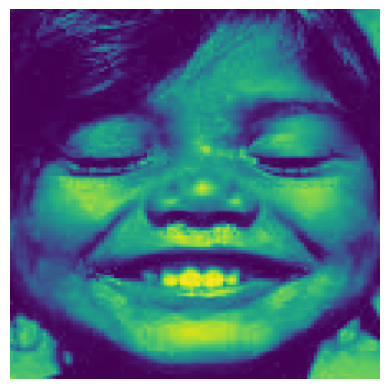

Label:  happiness
Previsão:  happiness
Probabilidade:  0.17877634


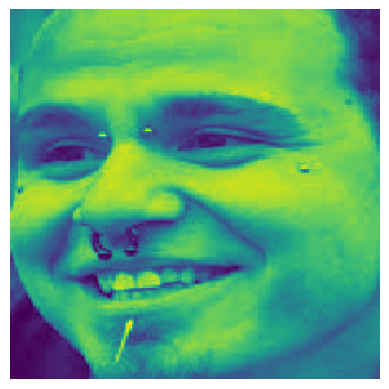

Label:  happiness
Previsão:  happiness
Probabilidade:  0.25036058


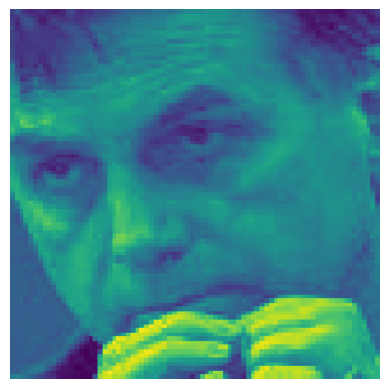

Label:  anger
Previsão:  neutrality
Probabilidade:  0.18117577


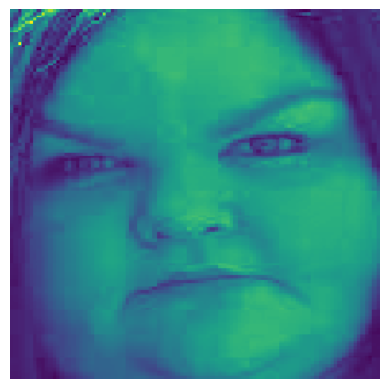

Label:  anger
Previsão:  neutrality
Probabilidade:  0.22297831


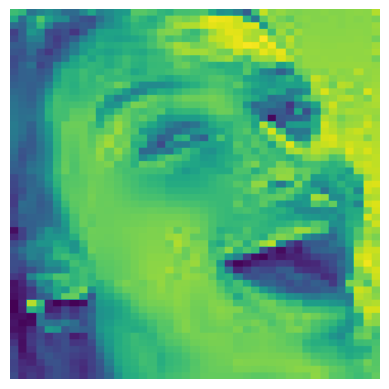

Label:  happiness
Previsão:  happiness
Probabilidade:  0.27823022


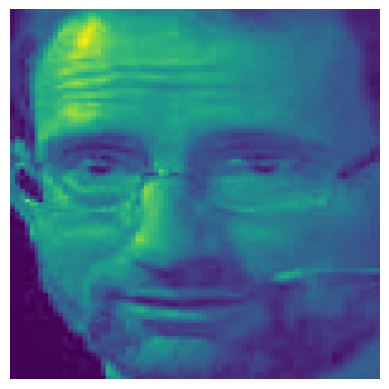

Label:  fear
Previsão:  sadness
Probabilidade:  0.19558309


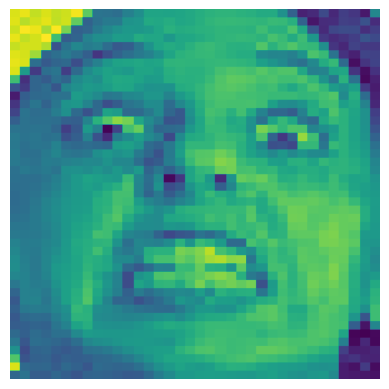

Label:  anger
Previsão:  happiness
Probabilidade:  0.17470191


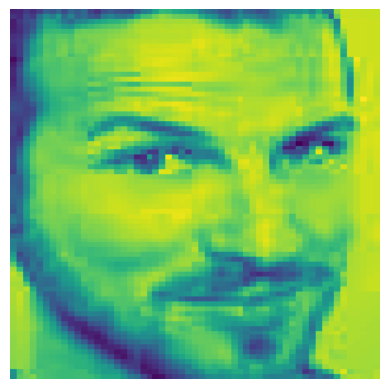

Label:  happiness
Previsão:  happiness
Probabilidade:  0.19487183


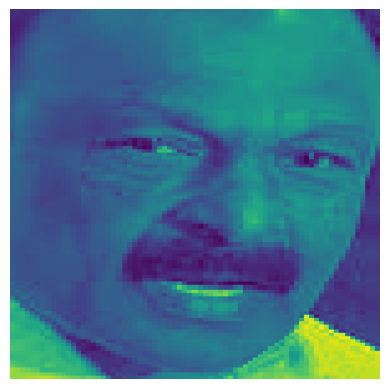

Label:  anger
Previsão:  happiness
Probabilidade:  0.23142423


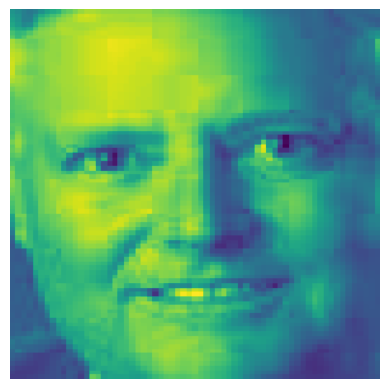

Label:  happiness
Previsão:  happiness
Probabilidade:  0.23643325


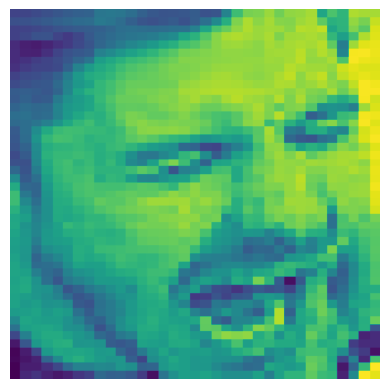

Label:  anger
Previsão:  happiness
Probabilidade:  0.2460057


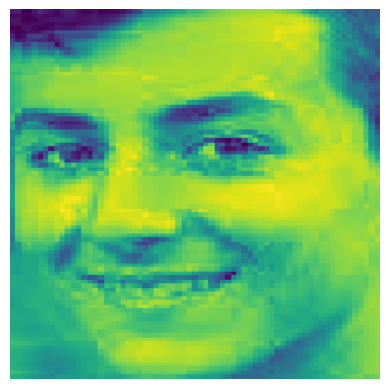

Label:  happiness
Previsão:  happiness
Probabilidade:  0.1821052


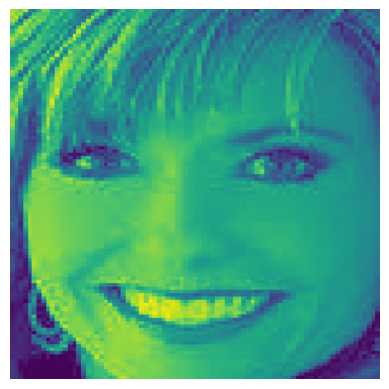

Label:  happiness
Previsão:  happiness
Probabilidade:  0.2980396


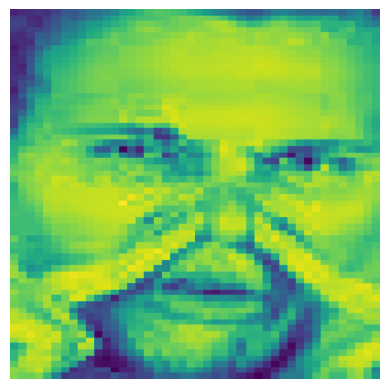

Label:  disgust
Previsão:  happiness
Probabilidade:  0.2671547


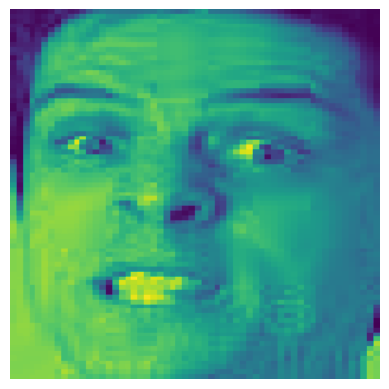

Label:  anger
Previsão:  fear
Probabilidade:  0.15530677


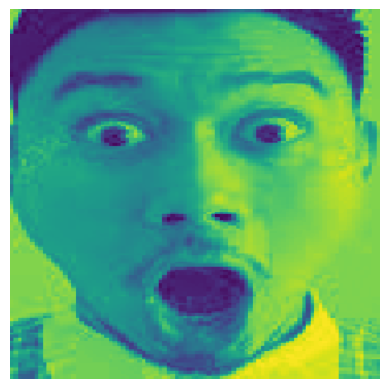

Label:  surprise
Previsão:  surprise
Probabilidade:  0.41647536


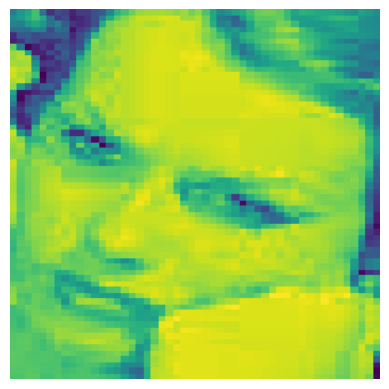

Label:  sadness
Previsão:  happiness
Probabilidade:  0.21460797


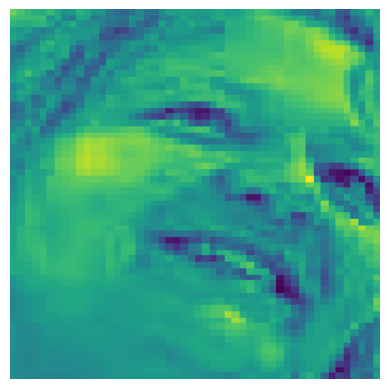

Label:  fear
Previsão:  happiness
Probabilidade:  0.19083816


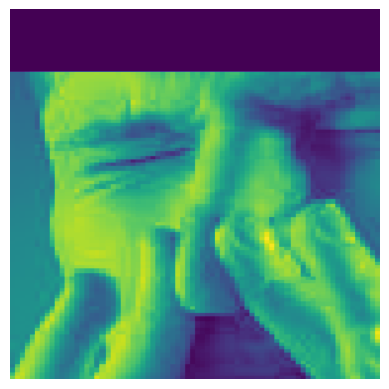

Label:  disgust
Previsão:  neutrality
Probabilidade:  0.19573526


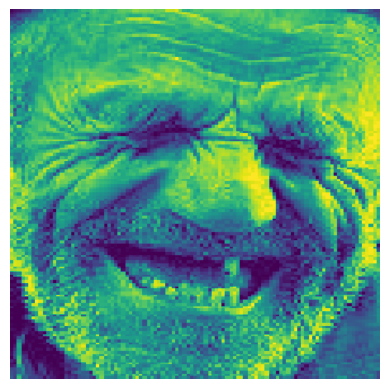

Label:  happiness
Previsão:  happiness
Probabilidade:  0.34106526


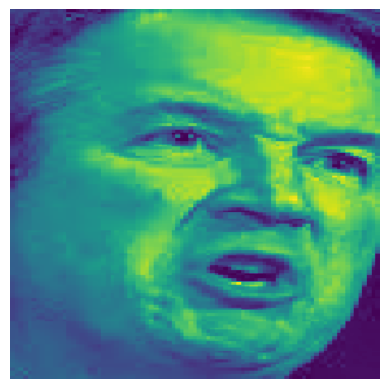

Label:  anger
Previsão:  happiness
Probabilidade:  0.2054832


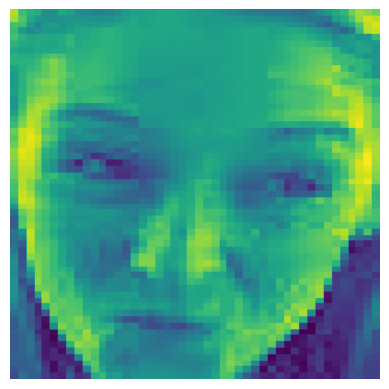

Label:  disgust
Previsão:  happiness
Probabilidade:  0.21885695


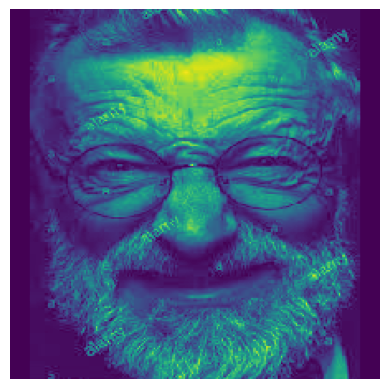

Label:  anger
Previsão:  happiness
Probabilidade:  0.40596727


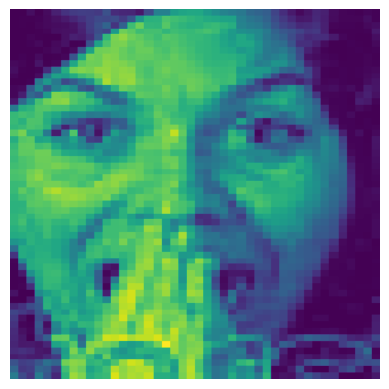

Label:  fear
Previsão:  sadness
Probabilidade:  0.19487071


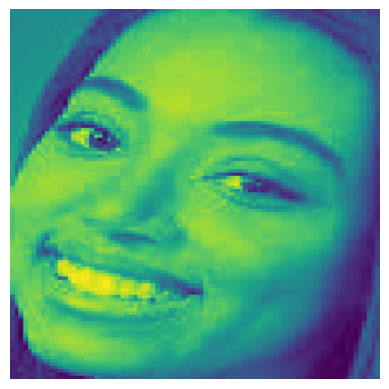

Label:  happiness
Previsão:  happiness
Probabilidade:  0.20400138


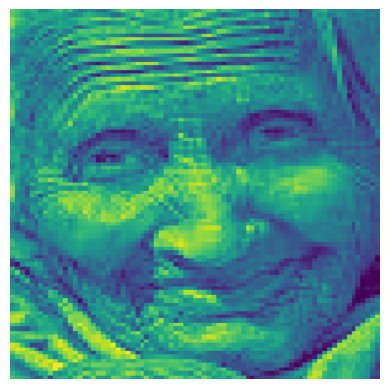

Label:  happiness
Previsão:  surprise
Probabilidade:  0.24122928


In [52]:
count = 0
y_pred = list()
y_true = list()
class_names = ['anger','contempt','disgust','fear','happiness','neutrality','sadness','surprise']

# Loop do data generator de teste que contem as imagens
for batch in test_generator:

    count+=1

    # Condição de saída do loop. Só executaremos o modelo em algumas imagens
    if count == 3:
        break

    else:

        # Pegando a imagem e o label
        images = batch[0]
        labels = batch[1]

        # Previsão
        predictions = loaded_model.predict(images)

        # Visualização da imagem
        for i in range(len(images)):

            image = images[i]
            label = labels[i]
            prediction = predictions[i]

            # Converte o array de previsão para visualizar a classe e a probabilidade
            predicted_class = np.argmax(prediction)
            probability = prediction[predicted_class]
            label = class_names[np.argmax(label)]
            y_true.append(label)

            # Faz o DE-PARA da probabilidade com o tipo de classe da previsão
            dict_class={
                0: 'anger',
                1: 'contempt',
                2: 'disgust',
                3: 'fear',
                4: 'happiness',
                5: 'neutrality',
                6: 'sadness',
                7: 'surprise'
            }


            class_name = dict_class.get(predicted_class)
            y_pred.append(class_name)

            # Configura a saída das imagens que serão visualizadas
            plt.imshow(images[i])
            plt.axis('Off')
            plt.show()

            # Imprime os resultados da classificação das images
            print("Label: ", label)
            print("Previsão: ", class_name)
            print("Probabilidade: ", probability)

Como o treinamento do modelo foi para fins didáticos, não foi possível treinar com um grande volume de dados e épocas, o que melhoraria a convergência e sua acurácia. Como os dados são desbalanceados para *happiness* e modelo teve poucas épocas para treinamento, o modelo acaba classificando as imagens com uma maior tendência para *happiness*.

#### Execução de modelo previamente treinado com mais épocas em cada uma das imagens de teste

In [53]:
# Download de modelo previamente treinado

file_id = "1PFxcBnsImoE2_ekLDe4zXtIdbaLvSfdA"
url = f"https://drive.google.com/uc?id={file_id}"

output = 'dataset/emotions/trained_models/trained_model.h5'
gdown.download(url, output)

Downloading...
From: https://drive.google.com/uc?id=1PFxcBnsImoE2_ekLDe4zXtIdbaLvSfdA
To: /content/dataset/emotions/trained_models/trained_model.h5
100%|██████████| 1.07G/1.07G [00:24<00:00, 44.1MB/s]


'dataset/emotions/trained_models/trained_model.h5'

In [55]:
# Carga do modelo previamente treinado com 100 épocas
name_model='trained_model.h5'
loaded_model = keras.models.load_model("%s/%s" % (path_model, name_model))
print("Modelo %s carregado com sucesso" % (name_model))

Modelo trained_model.h5 carregado com sucesso


1/1 [==============================] - 5s 5s/step


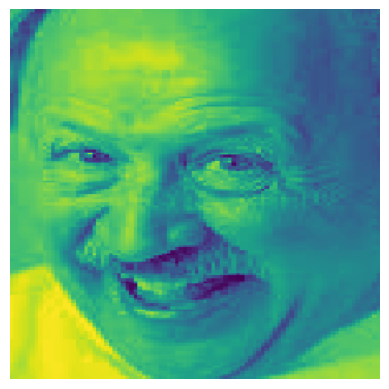

Label:  happiness
Previsão:  happiness
Probabilidade:  0.61482126


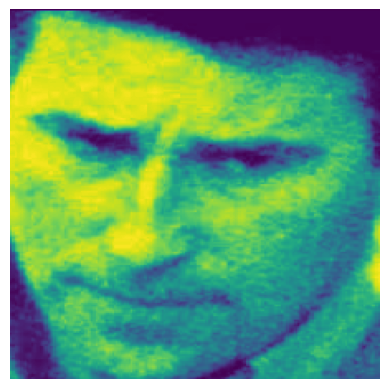

Label:  contempt
Previsão:  anger
Probabilidade:  0.47656786


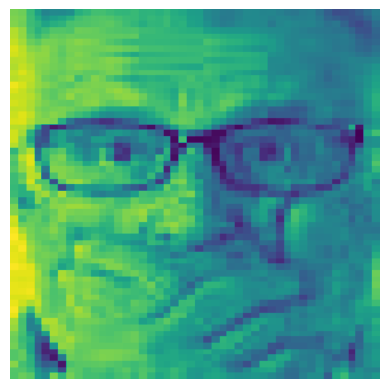

Label:  surprise
Previsão:  surprise
Probabilidade:  0.98309565


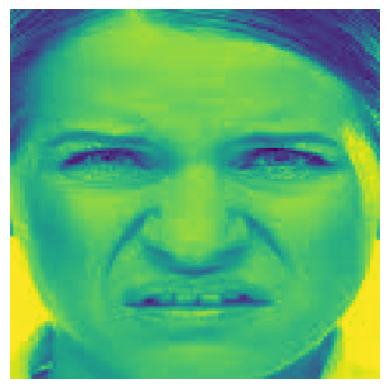

Label:  surprise
Previsão:  disgust
Probabilidade:  0.48254058


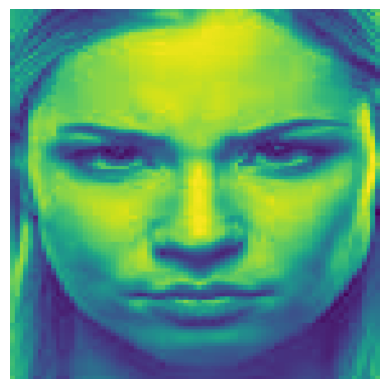

Label:  anger
Previsão:  anger
Probabilidade:  0.6935514


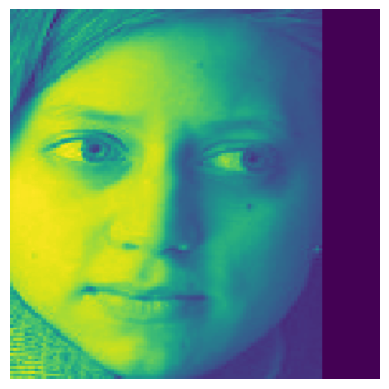

Label:  neutrality
Previsão:  neutrality
Probabilidade:  0.7215192


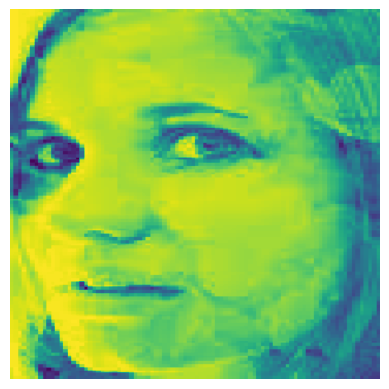

Label:  fear
Previsão:  fear
Probabilidade:  0.9248802


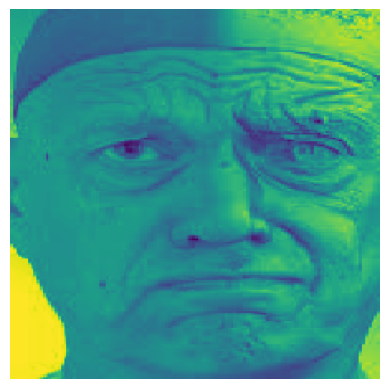

Label:  sadness
Previsão:  contempt
Probabilidade:  0.21901594


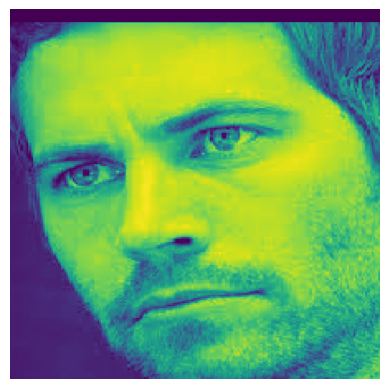

Label:  anger
Previsão:  anger
Probabilidade:  0.91419345


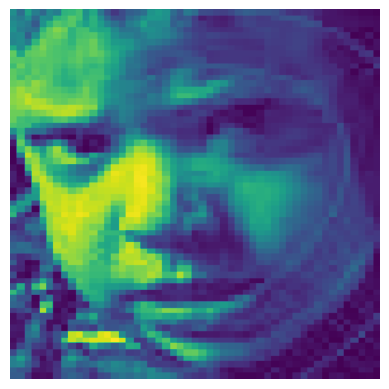

Label:  anger
Previsão:  anger
Probabilidade:  0.4754673


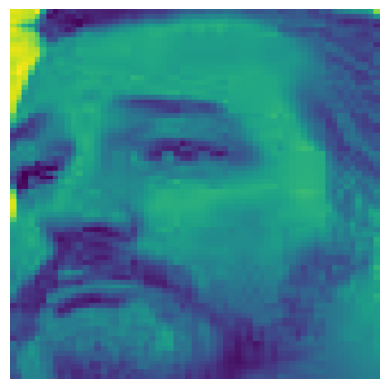

Label:  sadness
Previsão:  sadness
Probabilidade:  0.5287125


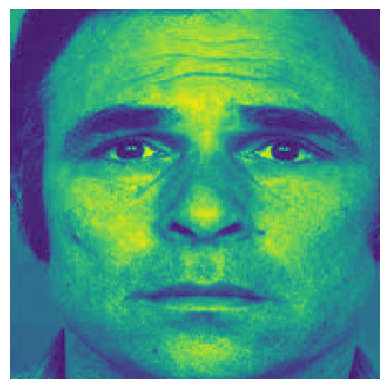

Label:  surprise
Previsão:  neutrality
Probabilidade:  0.5964266


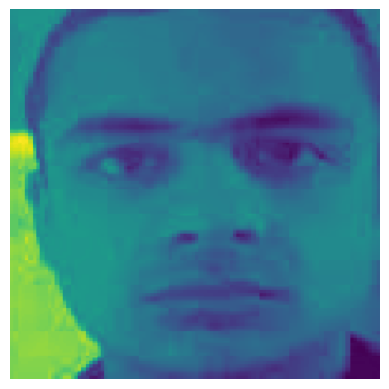

Label:  neutrality
Previsão:  neutrality
Probabilidade:  0.752874


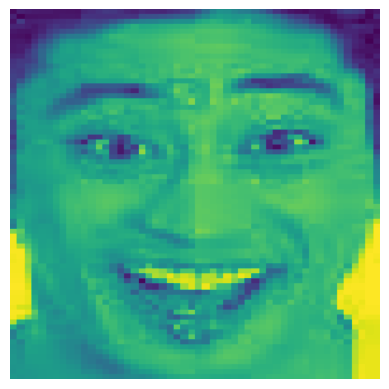

Label:  surprise
Previsão:  surprise
Probabilidade:  0.7945648


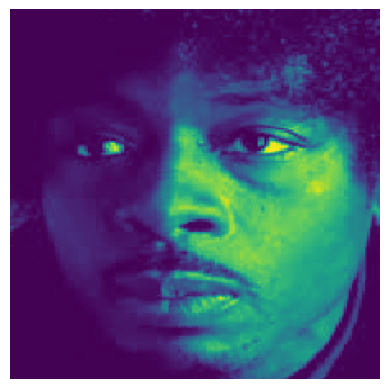

Label:  disgust
Previsão:  sadness
Probabilidade:  0.63158494


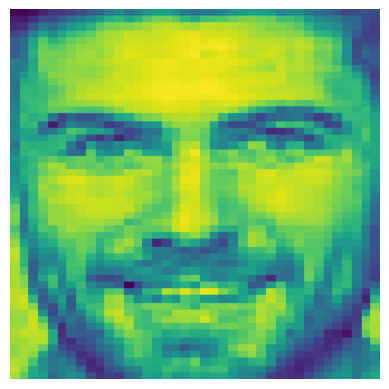

Label:  happiness
Previsão:  happiness
Probabilidade:  0.7357459


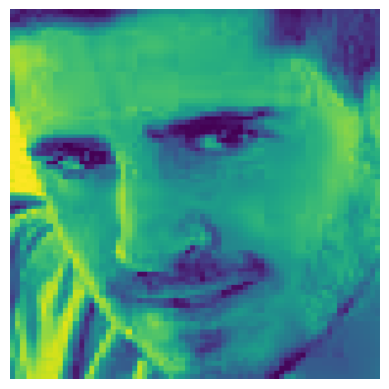

Label:  anger
Previsão:  anger
Probabilidade:  0.8908391


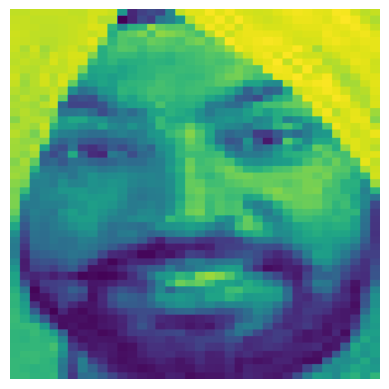

Label:  happiness
Previsão:  surprise
Probabilidade:  0.84005123


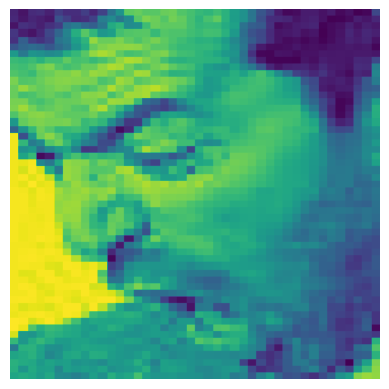

Label:  anger
Previsão:  surprise
Probabilidade:  0.32467413


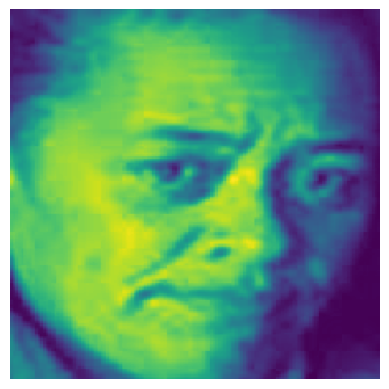

Label:  sadness
Previsão:  neutrality
Probabilidade:  0.3485123


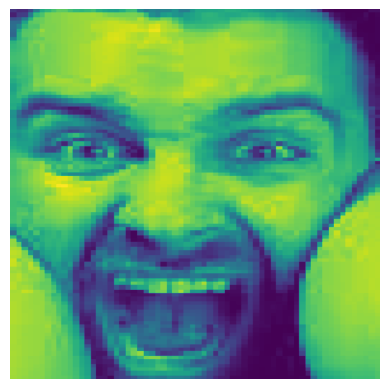

Label:  fear
Previsão:  happiness
Probabilidade:  0.9039259


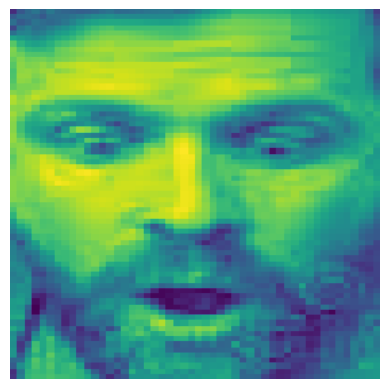

Label:  surprise
Previsão:  surprise
Probabilidade:  0.55561256


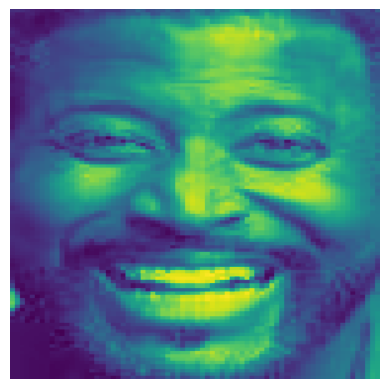

Label:  happiness
Previsão:  happiness
Probabilidade:  0.9943573


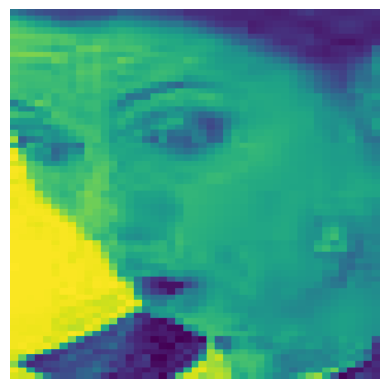

Label:  surprise
Previsão:  surprise
Probabilidade:  0.9686102


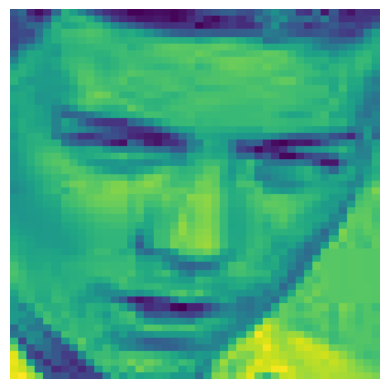

Label:  anger
Previsão:  anger
Probabilidade:  0.7916394


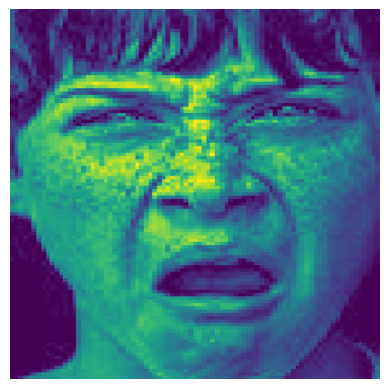

Label:  disgust
Previsão:  disgust
Probabilidade:  0.5428535


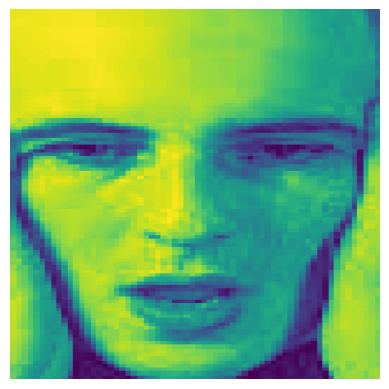

Label:  sadness
Previsão:  sadness
Probabilidade:  0.5923873


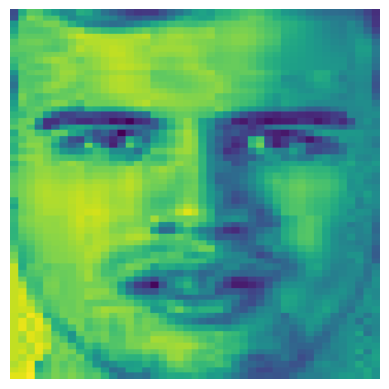

Label:  sadness
Previsão:  anger
Probabilidade:  0.3166089


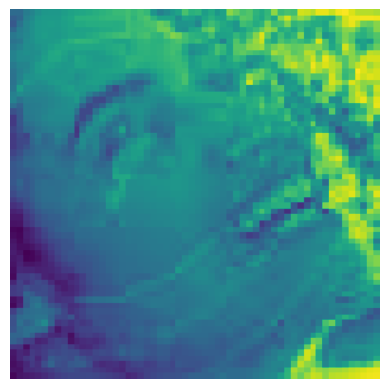

Label:  happiness
Previsão:  happiness
Probabilidade:  0.72476053


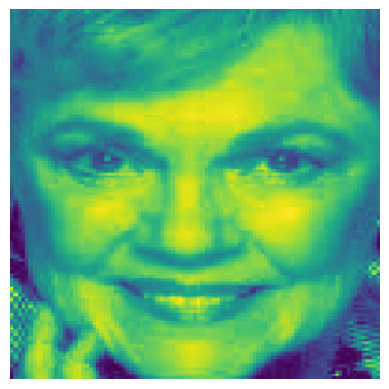

Label:  happiness
Previsão:  happiness
Probabilidade:  0.7473736


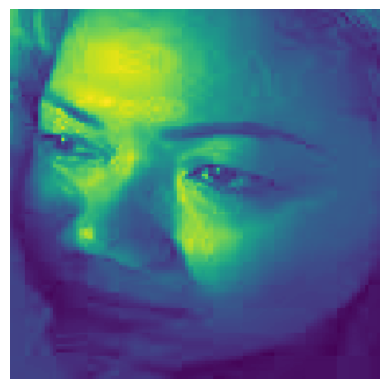

Label:  sadness
Previsão:  anger
Probabilidade:  0.34294793


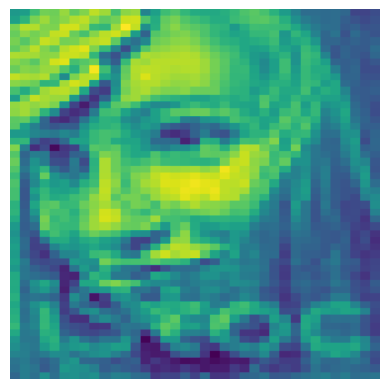

Label:  happiness
Previsão:  happiness
Probabilidade:  0.52541214
1/1 [==============================] - 3s 3s/step


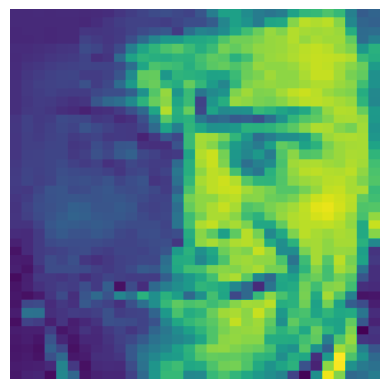

Label:  fear
Previsão:  fear
Probabilidade:  0.29545227


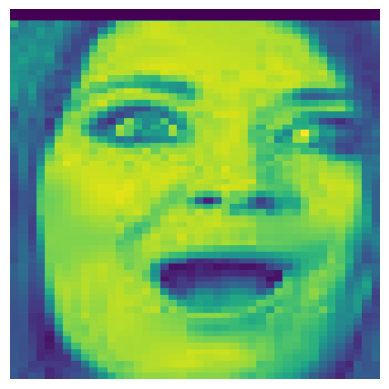

Label:  surprise
Previsão:  surprise
Probabilidade:  0.9912891


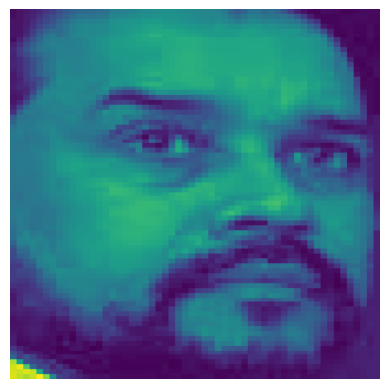

Label:  neutrality
Previsão:  neutrality
Probabilidade:  0.55095124


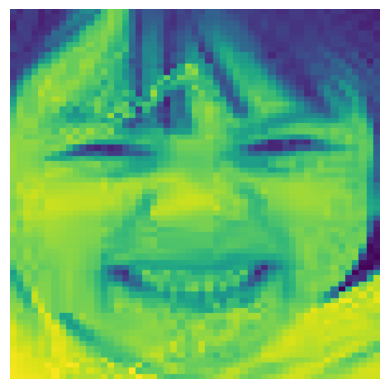

Label:  happiness
Previsão:  happiness
Probabilidade:  0.9893574


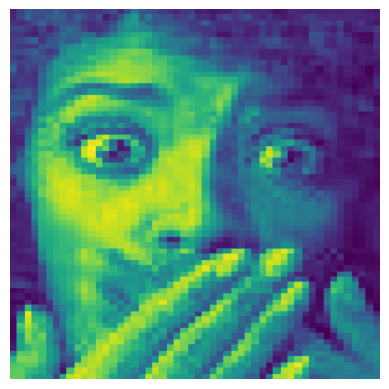

Label:  surprise
Previsão:  surprise
Probabilidade:  0.7299789


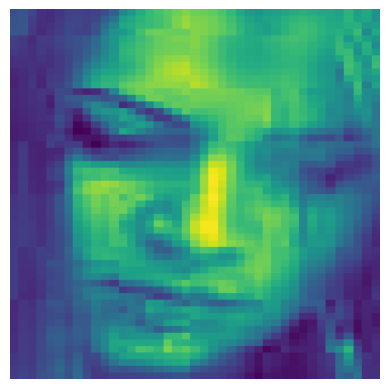

Label:  sadness
Previsão:  neutrality
Probabilidade:  0.44704154


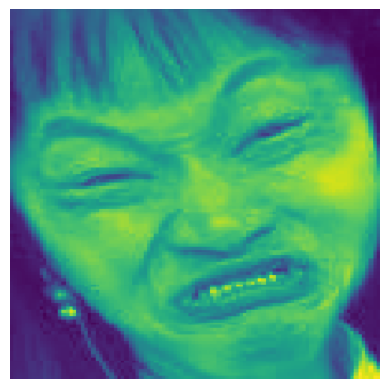

Label:  disgust
Previsão:  happiness
Probabilidade:  0.6595595


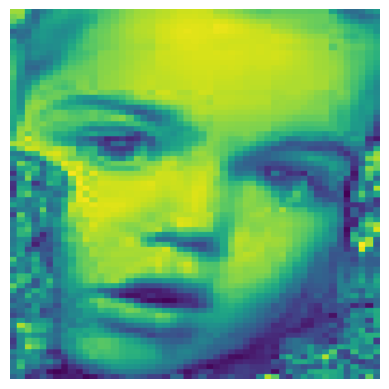

Label:  surprise
Previsão:  surprise
Probabilidade:  0.7167153


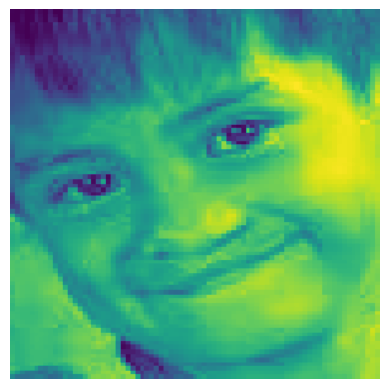

Label:  anger
Previsão:  anger
Probabilidade:  0.26549363


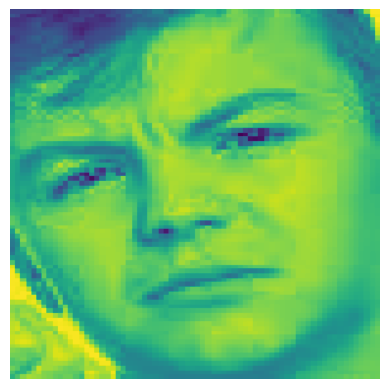

Label:  anger
Previsão:  surprise
Probabilidade:  0.24840683


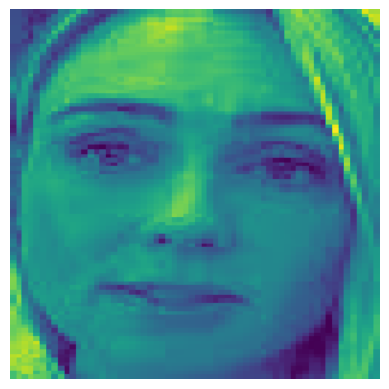

Label:  neutrality
Previsão:  neutrality
Probabilidade:  0.7542028


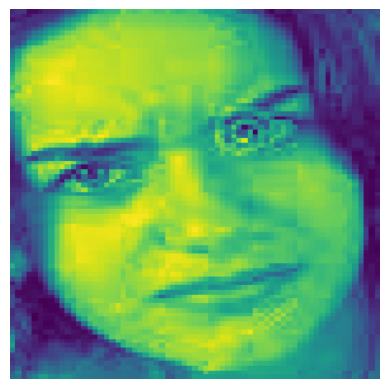

Label:  anger
Previsão:  neutrality
Probabilidade:  0.78304595


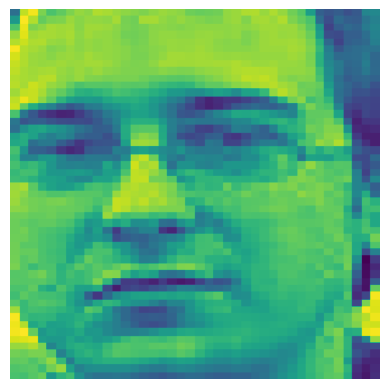

Label:  neutrality
Previsão:  happiness
Probabilidade:  0.39486024


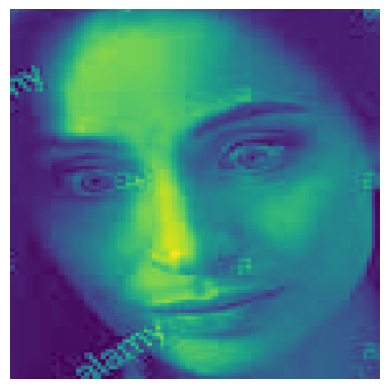

Label:  surprise
Previsão:  neutrality
Probabilidade:  0.5201745


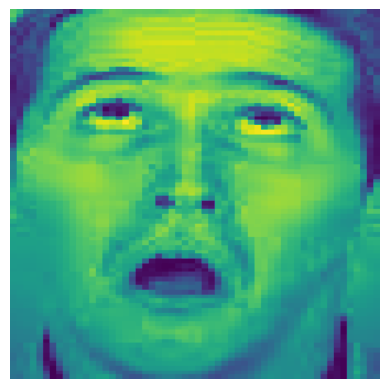

Label:  fear
Previsão:  fear
Probabilidade:  0.69835967


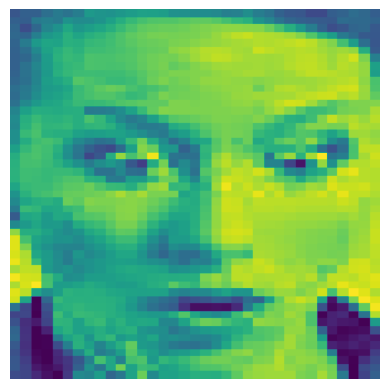

Label:  surprise
Previsão:  sadness
Probabilidade:  0.66240495


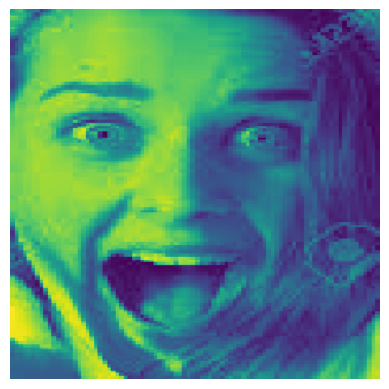

Label:  surprise
Previsão:  surprise
Probabilidade:  0.920431


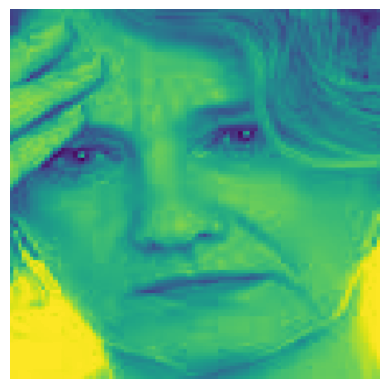

Label:  anger
Previsão:  anger
Probabilidade:  0.36251238


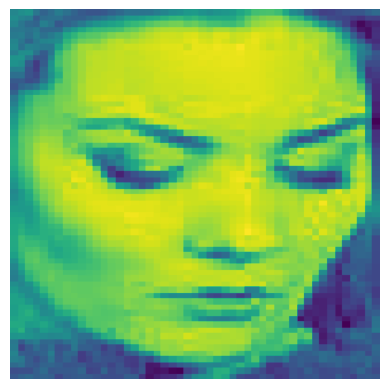

Label:  sadness
Previsão:  sadness
Probabilidade:  0.8994602


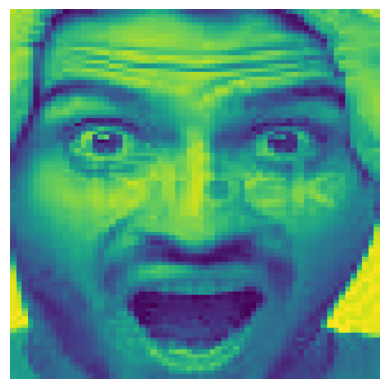

Label:  surprise
Previsão:  surprise
Probabilidade:  0.49128


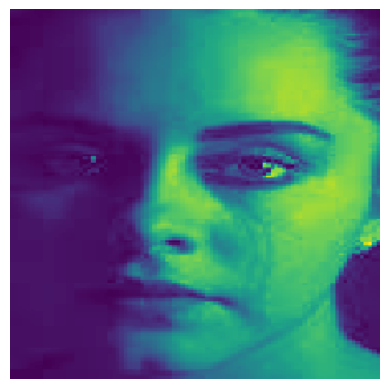

Label:  sadness
Previsão:  sadness
Probabilidade:  0.43254182


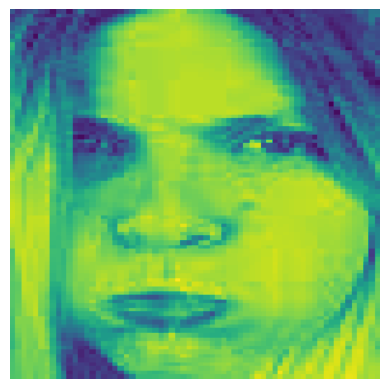

Label:  anger
Previsão:  anger
Probabilidade:  0.39838383


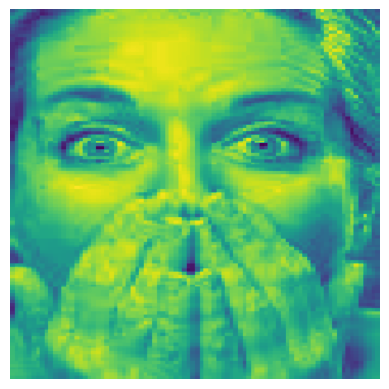

Label:  surprise
Previsão:  contempt
Probabilidade:  0.28519526


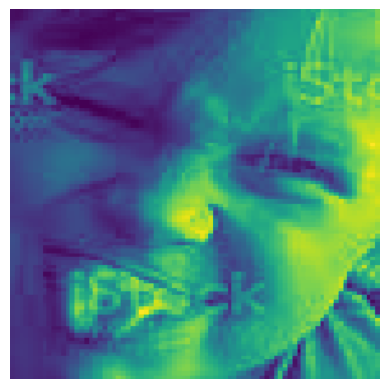

Label:  anger
Previsão:  sadness
Probabilidade:  0.55797434


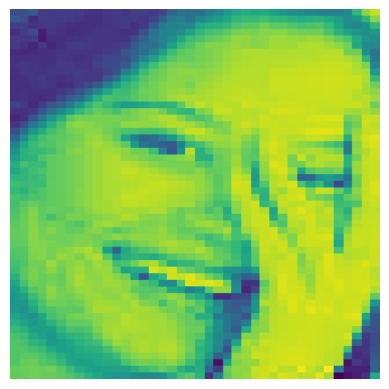

Label:  happiness
Previsão:  happiness
Probabilidade:  0.70519763


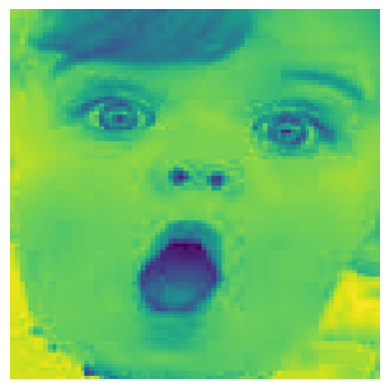

Label:  surprise
Previsão:  surprise
Probabilidade:  0.8927276


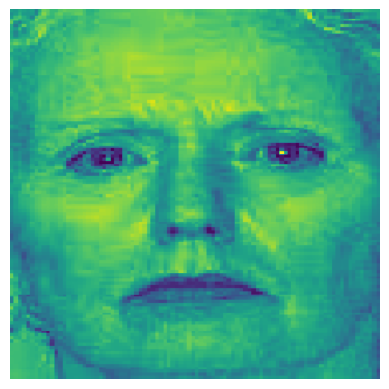

Label:  anger
Previsão:  anger
Probabilidade:  0.53600615


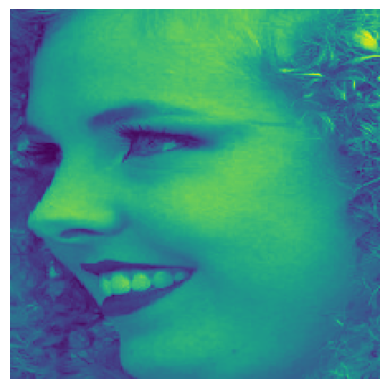

Label:  happiness
Previsão:  happiness
Probabilidade:  0.91093385


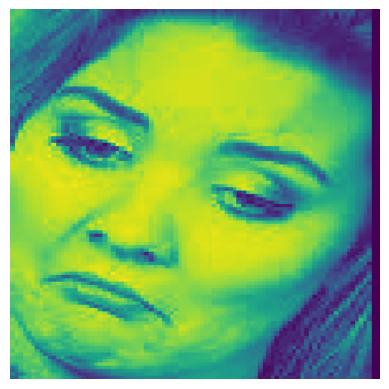

Label:  sadness
Previsão:  sadness
Probabilidade:  0.9925374


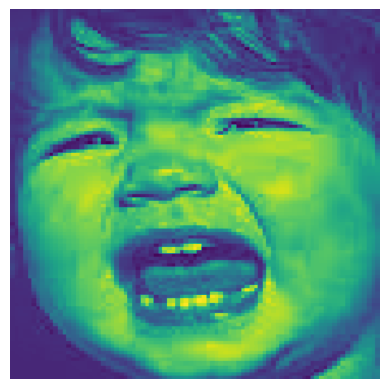

Label:  anger
Previsão:  anger
Probabilidade:  0.9981087


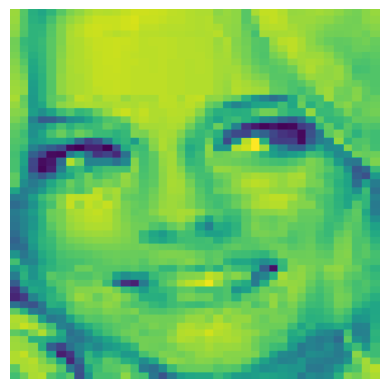

Label:  happiness
Previsão:  happiness
Probabilidade:  0.903147


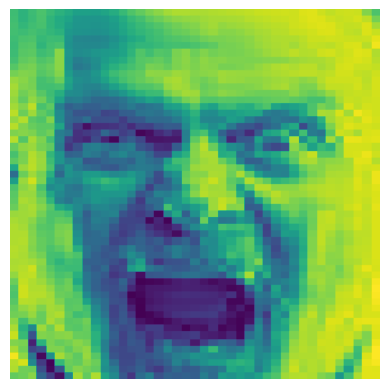

Label:  anger
Previsão:  anger
Probabilidade:  0.93298453


In [56]:
count = 0
y_pred = list()
y_true = list()
class_names = ['anger','contempt','disgust','fear','happiness','neutrality','sadness','surprise']

# Loop do data generator de teste que contem as imagens
for batch in test_generator:

    count+=1

    # Condição de saída do loop. Só executaremos o modelo em algumas imagens
    if count == 3:
        break

    else:

        # Pegando a imagem e o label
        images = batch[0]
        labels = batch[1]

        # Previsão
        predictions = loaded_model.predict(images)

        # Visualização da imagem
        for i in range(len(images)):

            image = images[i]
            label = labels[i]
            prediction = predictions[i]

            # Converte o array de previsão para visualizar a classe e a probabilidade
            predicted_class = np.argmax(prediction)
            probability = prediction[predicted_class]
            label = class_names[np.argmax(label)]
            y_true.append(label)

            # Faz o DE-PARA da probabilidade com o tipo de classe da previsão
            dict_class={
                0: 'anger',
                1: 'contempt',
                2: 'disgust',
                3: 'fear',
                4: 'happiness',
                5: 'neutrality',
                6: 'sadness',
                7: 'surprise'
            }


            class_name = dict_class.get(predicted_class)
            y_pred.append(class_name)

            # Configura a saída das imagens que serão visualizadas
            plt.imshow(images[i])
            plt.axis('Off')
            plt.show()

            # Imprime os resultados da classificação das images
            print("Label: ", label)
            print("Previsão: ", class_name)
            print("Probabilidade: ", probability)

In [57]:
# Calculando as métricas
accuracy = skm.accuracy_score(y_true, y_pred)
precision = skm.precision_score(y_true, y_pred, average='weighted')
recall = skm.recall_score(y_true, y_pred, average='weighted')
f1score = skm.f1_score(y_true, y_pred, average='weighted')

print("Accuracy: ", accuracy)
print("Precision: ", precision)
print("Recall: ", recall)
print("F1 Score: ", f1score)

Accuracy:  0.6875
Precision:  0.7149677579365079
Recall:  0.6875
F1 Score:  0.6922114463601532


Todas as métricas aumentaram significativamente com o aumento de épocas no modelo de treinamento.

Text(0.5, -22.228300788041047, 'Label predito')

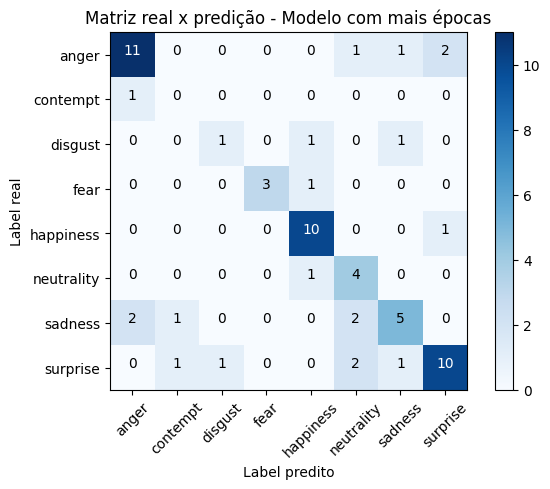

In [82]:
cm=cnf_matrix
cmap=plt.cm.Blues
title='Matriz real x predição - Modelo com mais épocas'
classes=class_names

plt.imshow(cm, interpolation='nearest', cmap=cmap)
plt.title(title)
plt.colorbar()
tick_marks = np.arange(len(classes))
plt.xticks(tick_marks, classes, rotation=45)
plt.yticks(tick_marks, classes)

thresh = cm.max() / 2.
for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
  plt.text(j, i, cm[i, j],
            horizontalalignment="center",
            color="white" if cm[i, j] > thresh else "black");

plt.tight_layout()
plt.ylabel('Label real')
plt.xlabel('Label predito')

A Matriz Confusão está melhor distribuida, evitando a concentração da previsão de classe *happiness* vista no modelo treinado com 5 épocas.

#Conclusão

##Modelo utilizando métodos clássicos
Para o dataset de ataques cardíacos, o desempenho e a aplicação de modelos clássicos se mostrou altamente satisfatórios. Isso se deve à aplicação criteriosa das melhores práticas na seleção de classificadores, na escolha de atributos relevantes e na otimização dos hiperparâmetros, resultando em um desempenho excepcional para o modelo escolhido.

##Modelo utilizando Deep Learning
A utilização da Rede Neural Convulacional para Deep Learning para este MVP pode ser considerada um sucesso. Devido à considerável quantidade de imagens necessárias para o treinamento, o processo pode demandar um tempo significativo e requer recursos computacionais substanciais. Outras questões que podem ser estudadas é uma melhoria na Arquitetura da Rede e ajustes dos parâmetros de treinamento afim de encontrar um ponto de equilíbrio entre eficiência treinamento, uso de recursos computacionais e precisão do modelo.